# Demanda Soja

Preciso criar uma tabela de demanda contendo:

![image.png](../images/mercado_001.drawio.png)

- Preço e quantidade para diferentes cenários


# Inicializaçao

In [2]:
import pandas as pd
import numpy as np
import json
import importlib, sys, os, requests
from datetime import date, datetime

from pathlib import Path
sys.path.append(str(Path(os.path.abspath('')).parents[0]))


import seaborn as sns
import matplotlib.pyplot as plt

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

import yfinance as yf
import investpy


import support_library.common as common
_ = [importlib.reload(sys.modules[m]) for m in list(sys.modules) if 'support_library' in m]

In [3]:
# from pyspark import SparkContext as sc
# from pyspark import SparkFiles
# from pyspark.sql import SparkSession
# from pyspark.sql import functions as F
# from pyspark.sql import Window
# from pyspark.sql.types import *# StringType, FloatType, IntegerType, DataType
# import findspark
# findspark.init()

# spark = SparkSession\
#         .builder\
#         .appName("Tese ITA - Fabio Kfouri")\
#         .getOrCreate()
# spark

In [4]:
DATE_FORMAT = '%Y-%m-%d'
MIN_DATE    = "2010-01-01"
TODAY       = date.today()
TODAY_STR   = date.today().strftime(DATE_FORMAT)
THIS_YEAR   = "2022-01-01"
REF_MES     = 12 

DATASET     = r'../dataset/'

TODAY

datetime.date(2022, 4, 7)

# Fundamentos de Mercado - Soja

- Preços
- Oferta
- Demanda
- Estoque

## Preços e volume diário

|Tipo|Symbol|Unidade|ref|fonte|
|:-:|:--|:--|:--|---|
|Soja NY Futuros|ZSK2|U.S. cents por bushel|[ref](https://www.cmegroup.com/markets/agriculture/oilseeds/soybean.contractSpecs.html)|[source](https://finance.yahoo.com/quote/ZS%3DF/history?p=ZS%3DF)
|Óleo de Soja NY Futuros|ZLK2|U.S. cents per pound|[ref](https://www.cmegroup.com/markets/agriculture/oilseeds/soybean-oil.contractSpecs.html)|[source](https://finance.yahoo.com/quote/ZL%3DF/history?p=ZL%3DF)
|Farelo de Soja NY Futuros|ZMK2|U.S. dollars per short ton|[cme](https://www.cmegroup.com/markets/agriculture/oilseeds/soybean-meal.contractSpecs.html)|[source](https://finance.yahoo.com/quote/ZM%3DF/history?p=ZM%3DF)
|Soja Spot|ZS|???||[source](https://www.nasdaq.com/market-activity/commodities/zs/historical)
|Oleo de Soja Spot|ZL|???||[source](https://www.nasdaq.com/market-activity/commodities/zl/historical)
|Farelo de Soja Spot|ZM|||[source](https://www.nasdaq.com/market-activity/commodities/zm/historical)
|Global price of Soybeans Oil|PSOILUSDM|U.S. Dollars per Metric Ton (Monthly)||[fred](https://fred.stlouisfed.org/series/PSOILUSDM)|


### Conversoes
**soja**
- Um contrato possui 5000 bushels (grãos), ou 60000 lbs(óleo-pounds) ou 100 Ton (farelo).
- 5000 bushels $\approx$ 136 Metric Ton ($5000\div36.7437$)
- 1 USD/bushel $\approx$ 36.74 USD/Metric Ton ($1\times36.7437$)

**Oleo de soja**
- um contrato possui 60.000 libras
- 60000 lbs $\approx$ 27.3 Metric Ton ($60000\div2204.623$)
- 1 USD/lbs $\approx$ 2204.623 USD/Metric Ton ($1\times2204.623$)


**Farelo de Soja**
- Farelo, um contrato possui 100 toneladas curtas
- 100 toneladas curtas $\approx$ 91 Metric Ton ($100\div0.907185$)
- 1 USD/tonelada curta $\approx$ 1,10 USD/Metric Ton ($1\times1.102311$)


**Outros**
- 1 Tonelada $\approx$ 1.10231 Tonelada Curta (Unidade Americana)
- 1 cwt (hundredweight/quintal) $\approx$ 19,6841 Tonelada Metrica

### Precos e Volumes
Valores em Bushels e libras

In [5]:
df_soja = pd.DataFrame()

In [6]:
def __convert(symbol):
    """
    Retorna o nome, fator correcao para dolar
    """
    symbol = symbol.lower()
    if symbol=='zl':
        return 'oil', 1
    elif symbol=='zs':
        return 'grain', 1
    elif symbol=='zm':
        return 'meal', 1
    
    return None, None

In [7]:
def __get_futures(symbol):
    df = yf.Ticker(f"{symbol}=F").history(period="max")
    name, fator = __convert(symbol)
    
    df[f'{name}_future_price']  = df['Close'] * fator
    df[f'{name}_future_volume'] = df['Volume']

    #Filtro
    df = df[df.index > pd.to_datetime(MIN_DATE, format=DATE_FORMAT)] 
    return df[[f'{name}_future_price', f'{name}_future_volume']]

In [8]:
def __get_spot(symbol):
    name, fator = __convert(symbol)
    link = f'https://api.nasdaq.com/api/quote/{symbol}/historical?assetclass=commodities&fromdate=2001-01-01&limit=99999&todate={TODAY_STR}'

    headers={'authority':'api.nasdaq.com',
            'user-agent':"Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/99.0.4844.51 Safari/537.36"}

    req = requests.get(link, headers=headers)

    df = pd.DataFrame(req.json()['data']['tradesTable']['rows'])
    df = common.normalize_to_number(df)
    df['date'] = pd.to_datetime(df['date'], infer_datetime_format=True) 
    df.set_index('date', inplace=True)
    
    df['close']     = pd.to_numeric(df['close'],errors='coerce')
    df['volume']    = pd.to_numeric(df['volume'].str.replace(',',''),errors='coerce')

    df = df[df['close'] > 0]
    return df.iloc[:,:2].rename(columns={"close": f'{name}_spot_price' , "volume": f'{name}_spot_volume'})

In [9]:
df_soja = __get_futures(symbol='zs')
df_soja.tail()

,grain_future_price,grain_future_volume
Date,,
2022-04-01,1582.75,102861
2022-04-04,1602.25,71525
2022-04-05,1631.00,66277
2022-04-06,1619.50,66277
2022-04-07,1606.75,5939


In [10]:
df_soja = pd.merge(df_soja, __get_spot('zs'), how="left", left_index=True, right_index=True)
df_soja.tail()

,grain_future_price,grain_future_volume,grain_spot_price,grain_spot_volume
Date,,,,
2022-04-01,1582.75,102861,1582.75,90031.0
2022-04-04,1602.25,71525,1602.25,63835.0
2022-04-05,1631.00,66277,1631.00,57127.0
2022-04-06,1619.50,66277,1619.50,61686.0
2022-04-07,1606.75,5939,NaN,NaN


In [11]:
df_soja = pd.merge(df_soja, __get_futures(symbol='zl'), how="left", left_index=True, right_index=True)
df_soja.tail()

,grain_future_price,grain_future_volume,grain_spot_price,grain_spot_volume,oil_future_price,oil_future_volume
Date,,,,,,
2022-04-01,1582.75,102861,1582.75,90031.0,71.199997,45748
2022-04-04,1602.25,71525,1602.25,63835.0,72.339996,33686
2022-04-05,1631.00,66277,1631.00,57127.0,72.410004,37759
2022-04-06,1619.50,66277,1619.50,61686.0,71.830002,37759
2022-04-07,1606.75,5939,NaN,NaN,71.720001,3295


In [12]:
df_soja = pd.merge(df_soja, __get_spot(symbol='zl'), how="left", left_index=True, right_index=True)
df_soja.tail()

,grain_future_price,grain_future_volume,grain_spot_price,grain_spot_volume,oil_future_price,oil_future_volume,oil_spot_price,oil_spot_volume
Date,,,,,,,,
2022-04-01,1582.75,102861,1582.75,90031.0,71.199997,45748,71.199997,42675.0
2022-04-04,1602.25,71525,1602.25,63835.0,72.339996,33686,72.339996,29258.0
2022-04-05,1631.00,66277,1631.00,57127.0,72.410004,37759,72.410004,35116.0
2022-04-06,1619.50,66277,1619.50,61686.0,71.830002,37759,71.830002,33137.0
2022-04-07,1606.75,5939,NaN,NaN,71.720001,3295,NaN,NaN


### charts precos

Comparativo simples, pelos valores apresentados no site

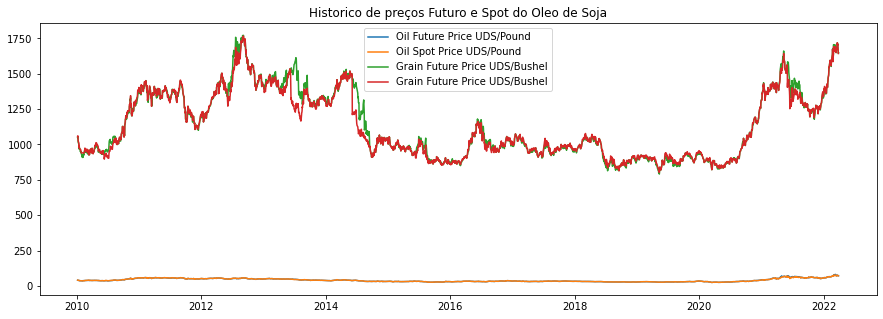

In [12]:
plt.figure(figsize=(15,5))

plt.plot(df_soja.index, df_soja['oil_future_price'], label='Oil Future Price UDS/Pound', );
plt.plot(df_soja.index, df_soja['oil_spot_price'], label='Oil Spot Price UDS/Pound');
plt.plot(df_soja.index, df_soja['grain_future_price'], label='Grain Future Price UDS/Bushel');
plt.plot(df_soja.index, df_soja['grain_spot_price'], label='Grain Future Price UDS/Bushel');
plt.title("Historico de preços Futuro e Spot do Oleo de Soja")
plt.legend(loc='best');


Comparativo convertendo as unidade em USD/Ton

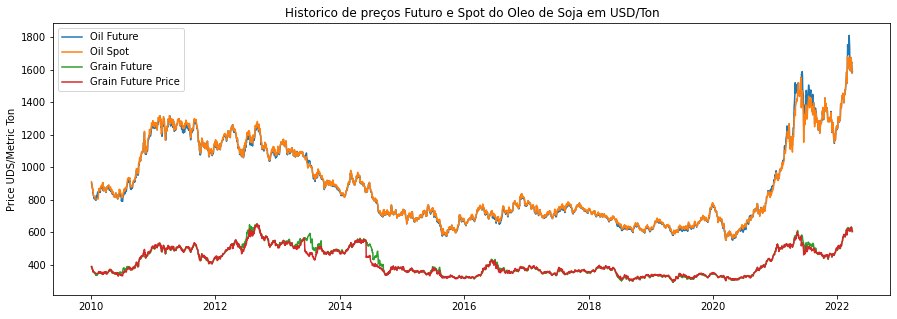

In [13]:

plt.figure(figsize=(15,5))

plt.plot(df_soja.index, df_soja['oil_future_price'] * 2204.623 / 100, label='Oil Future', );
plt.plot(df_soja.index, df_soja['oil_spot_price']* 2204.623 / 100, label='Oil Spot');
plt.plot(df_soja.index, df_soja['grain_future_price']* 36.7437/100 , label='Grain Future');
plt.plot(df_soja.index, df_soja['grain_spot_price']* 36.7437/100, label='Grain Future Price');
plt.title("Historico de preços Futuro e Spot do Oleo de Soja em USD/Ton")
plt.ylabel('Price UDS/Metric Ton')
plt.legend(loc='best');

In [14]:
def _slider(fig):
    # Add range slider
    fig.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                         label="1m",
                         step="month",
                         stepmode="backward"),
                    dict(count=6,
                         label="6m",
                         step="month",
                         stepmode="backward"),
                    dict(count=1,
                         label="YTD",
                         step="year",
                         stepmode="todate"),
                    dict(count=1,
                         label="1y",
                         step="year",
                         stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

In [15]:
# fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace( 
    go.Scatter(x=list(df_soja.index), 
               y=list(df_soja['oil_future_price']), 
               name= 'oil_future_price' )
)
fig.add_trace( 
    go.Scatter(x=list(df_soja.index), 
               y=list(df_soja['oil_spot_price']), 
               name= 'oil_spot_price') 
)
fig.add_trace( 
    go.Scatter(x=list(df_soja.index), 
               y=list(df_soja['oil_future_price']/df_soja['oil_spot_price']), 
               name= 'rate') ,
    secondary_y=True,
)
_slider(fig)
fig.show()

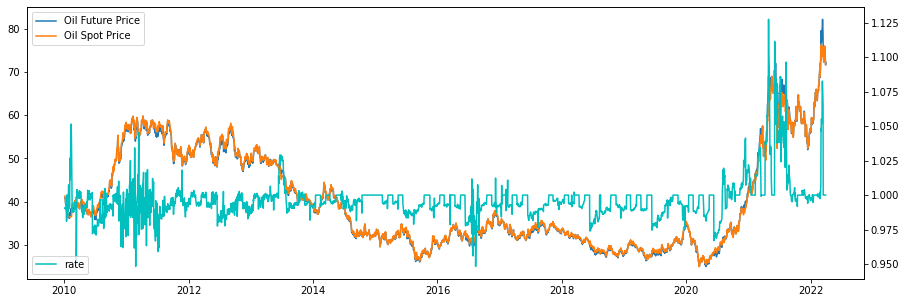

In [16]:
fig, axs1 = plt.subplots(figsize=(15,5))


axs1.plot(df_soja.index, df_soja['oil_future_price'], label='Oil Future Price', );
axs1.plot(df_soja.index, df_soja['oil_spot_price'], label='Oil Spot Price');

axs2 = axs1.twinx()
axs2.plot(df_soja.index, df_soja['oil_future_price']/df_soja['oil_spot_price'], label='rate', color='c');

axs1.legend(loc='upper left');
axs2.legend(loc='lower left');

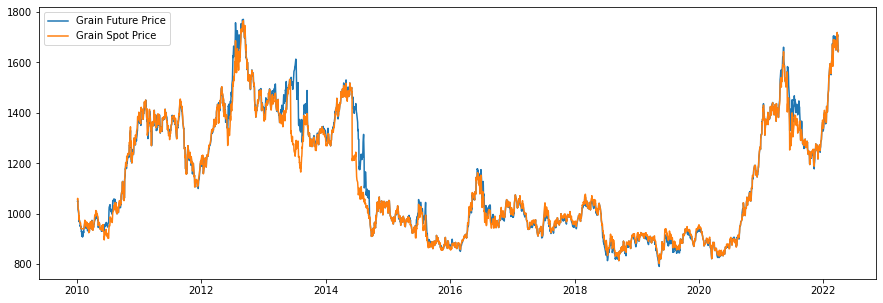

In [17]:
plt.figure(figsize=(15,5))
plt.plot(df_soja.index, df_soja['grain_future_price'], label='Grain Future Price', );
plt.plot(df_soja.index, df_soja['grain_spot_price'], label='Grain Spot Price');
# plt.plot(df_soja.index, df_soja['oil_future_price'], label='Oil Future Price');
# plt.plot(df_soja.index, df_soja['oil_future_price'], label='Oil Future Price');
plt.legend(loc='best');

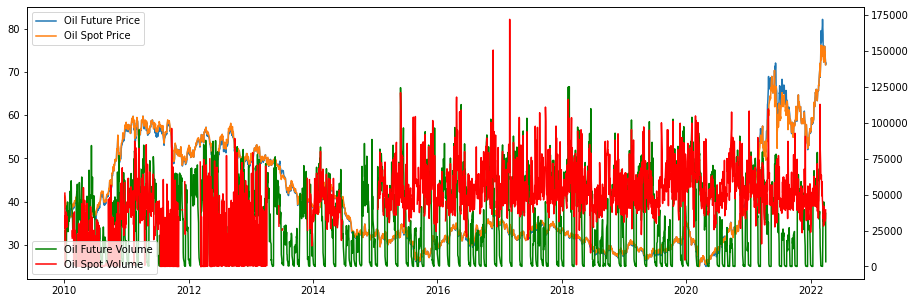

In [18]:
fig, axs1 = plt.subplots(figsize=(15,5))


axs1.plot(df_soja.index, df_soja['oil_future_price'], label='Oil Future Price', );
axs1.plot(df_soja.index, df_soja['oil_spot_price'], label='Oil Spot Price');

axs2 = axs1.twinx()
axs2.plot(df_soja.index, df_soja['oil_future_volume'], label='Oil Future Volume', color='g');
axs2.plot(df_soja.index, df_soja['oil_spot_volume'], label='Oil Spot Volume', color='r');

axs1.legend(loc='upper left');
axs2.legend(loc='lower left');

## Sazonalidade

- https://ncdex.com/products/SYBEANIDR
- https://ncdex.com/downloads/Products/COMMODITY%20AT%20A%20GLANCE_SOYYBEAN_22042019.pdf 
- https://ncdex.com/downloads/Products/COMMODITY%20AT%20A%20GLANCE_SOYBEAN_OIL_%2022042019.pdf

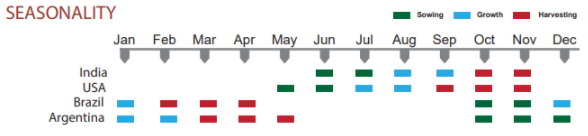

## Indices Soja

### Indice de Volatilidade da Soja [DEPRECATED]

In [19]:
df_ind = investpy.get_index_historical_data(index='CBOE/Cbot Soybean Volatility',  
                                   country='United States',
                                        from_date='01/01/2010',
                                        to_date=date.today().strftime('%d/%m/%Y'))
df_ind = df_ind.reset_index().rename(columns={'Close': 'siv', 'Date': 'date'})[['date','siv']].set_index('date')

### Indice S&P GSCI Soybean Oil Index (SGH1 e SG2J)

- https://www.barchart.com/futures/quotes/$SG1H
(este é o mesmo que https://ycharts.com/indices/%5ESPGSCISYO/level)

- https://www.barchart.com/stocks/quotes/$SG2J/interactive-chart

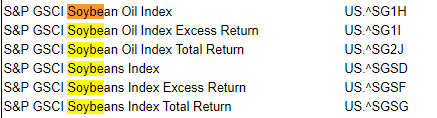
[ref](https://www.bullcharts.com.au/indiceslistName.asp)

In [20]:
df_sg2j = pd.read_csv(f'{DATASET}/SG2J_barchart.csv')
df_sg2j.columns = ['symbol', 'date', 'open','high','low', 'close', 'z' ]
df_sg2j['date'] = pd.to_datetime(df_sg2j['date'])
_df_sg2j = df_sg2j.rename(columns={'close': 'sg2j'}).set_index('date')['sg2j'].to_frame()

df_ind = pd.merge(df_ind, _df_sg2j, how="outer", left_index=True, right_index=True)


df_sg1h = pd.read_csv(f'{DATASET}/SG1H_barchart.csv')
df_sg1h.columns = ['symbol', 'date', 'open','high','low', 'close', 'z' ]
df_sg1h['date'] = pd.to_datetime(df_sg1h['date'])
_df_sg1h =  df_sg1h.rename(columns={'close': 'sgh1'}).set_index('date')['sgh1'].to_frame()

df_ind = pd.merge(df_ind, _df_sg1h, how="outer", left_index=True, right_index=True)


### Bloomberg Soybean Oil Subindex (^BSYOS)

Acesso somente de 7 dias (2022-03-27)

|indice|link|captura|
|---|---|---|
|Bloomberg Soybean Oil Subindex (^BSYOS)|https://ycharts.com/indices/%5EBSYOS/level |[data](https://ycharts.com/charts/fund_data.json?annotations=&annualizedReturns=false&calcs=id%3Alevel%2Cinclude%3Atrue%2C%2C&chartType=interactive&chartView=&correlations=&dateSelection=range&displayDateRange=false&displayTicker=false&endDate=&format=real&legendOnChart=false&note=&partner=basic_2000&quoteLegend=false&recessions=false&scaleType=linear&securities=id%3A%5EBSYOS%2Cinclude%3Atrue%2C%2C&securityGroup=&securitylistName=&securitylistSecurityId=&source=false&splitType=single&startDate=&title=&units=false&useCustomColors=false&useEstimates=false&zoom=&redesign=true&chartCreator=&maxPoints=891)
||||

In [21]:
with open(f'{DATASET}/ychart_bsyos.json') as f:
    d = json.load(f)
    
df_temp = pd.DataFrame(d['chart_data'][0][0]['raw_data'], columns = ['date', 'bsyos'])

df_temp['date'] = pd.to_datetime(df_temp['date'], unit='ms')
df_temp.set_index('date', inplace=True)

df_ind = pd.merge(df_ind, df_temp, how="outer", left_index=True, right_index=True)


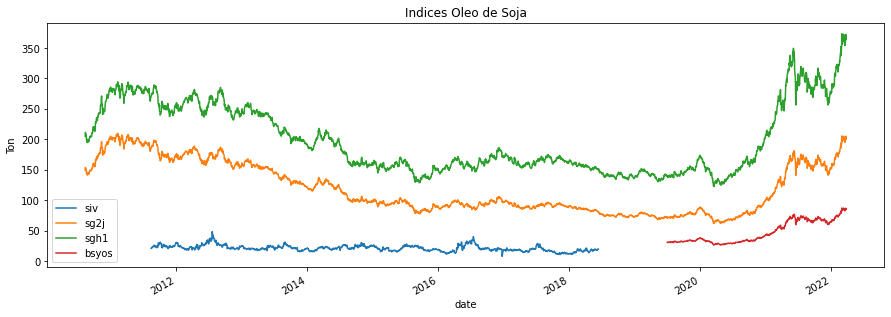

In [22]:
fig, axs = plt.subplots(figsize=(15,5))
df_ind.plot(ax = axs);
plt.title(f'Indices Oleo de Soja')
axs.set_ylabel("Ton");

In [23]:
df_ind.tail()

,siv,sg2j,sgh1,bsyos
date,,,,
2022-03-21,NaN,198.82,361.15,84.1154
2022-03-22,NaN,201.06,365.21,85.0625
2022-03-23,NaN,204.92,372.22,86.6944
2022-03-24,NaN,200.39,363.99,84.7772
2022-03-25,NaN,201.63,366.24,85.3022


## Open Interesting

Acesso somente de 7 dias (2022-03-27)

|indice|link|captura|
|---|---|---|
|CBOT Soybean Oil Combined Open Interest|https://ycharts.com/indicators/cbot_soybean_oil_combined_open_interest_ct|[data](https://ycharts.com/charts/fund_data.json?annotations=&annualizedReturns=false&calcs=&chartType=interactive&chartView=&correlations=&dateSelection=range&displayDateRange=false&displayTicker=false&endDate=&format=real&legendOnChart=false&note=&partner=basic_2000&quoteLegend=false&recessions=false&scaleType=linear&securities=id%3AI%3ACBOTSOCO%2Cinclude%3Atrue%2C%2C&securityGroup=&securitylistName=&securitylistSecurityId=&source=false&splitType=single&startDate=&title=&units=false&useCustomColors=false&useEstimates=false&zoom=&redesign=true&chartCreator=&maxPoints=891)|
|CBOT Soybean Oil Futures Open Interest|https://ycharts.com/indicators/cbot_soybean_oil_futures_open_interest_ct|[data](https://ycharts.com/charts/fund_data.json?annotations=&annualizedReturns=false&calcs=&chartType=interactive&chartView=&correlations=&dateSelection=range&displayDateRange=false&displayTicker=false&endDate=&format=real&legendOnChart=false&note=&partner=basic_2000&quoteLegend=false&recessions=false&scaleType=linear&securities=id%3AI%3ACBOTSOFO%2Cinclude%3Atrue%2C%2C&securityGroup=&securitylistName=&securitylistSecurityId=&source=false&splitType=single&startDate=&title=&units=false&useCustomColors=false&useEstimates=false&zoom=&redesign=true&chartCreator=&maxPoints=891)|

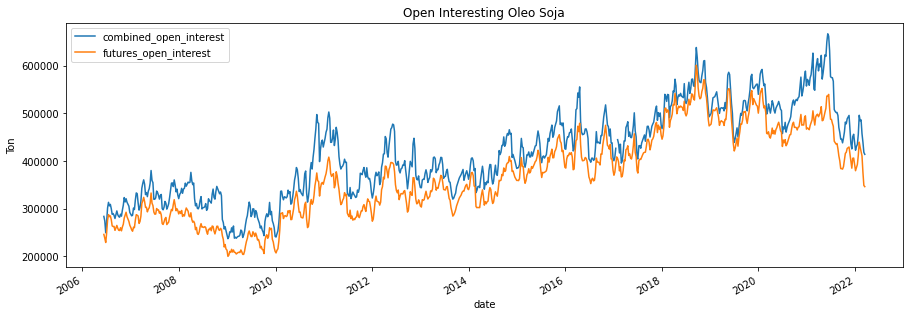

In [24]:
with open(f'{DATASET}/ychart_soybean_oil_combined_open_interest.json') as f:
    d = json.load(f)
    
df_oi = pd.DataFrame(d['chart_data'][0][0]['raw_data'], columns = ['date', 'combined_open_interest'])

df_oi['date'] = pd.to_datetime(df_oi['date'], unit='ms')
df_oi.set_index('date', inplace=True)


with open(f'{DATASET}/ychart_soybean_oil_futures_open_interest.json') as f:
    d = json.load(f)
    
df = pd.DataFrame(d['chart_data'][0][0]['raw_data'], columns = ['date', 'futures_open_interest'])

df['date'] = pd.to_datetime(df['date'], unit='ms')
df.set_index('date', inplace=True)


df_oi = pd.merge(df_oi, df, how="outer", left_index=True, right_index=True)


fig, axs = plt.subplots(figsize=(15,5))
df_oi.plot(ax = axs);
plt.title(f'Open Interesting Oleo Soja')
axs.set_ylabel("Ton");

ychart_soybean_oil_futures_open_interest.json

In [25]:
df_ind

,siv,sg2j,sgh1,bsyos
date,,,,
2010-08-12,NaN,149.05,204.94,NaN
2010-08-13,NaN,153.72,211.36,NaN
2010-08-16,NaN,149.91,206.12,NaN
2010-08-17,NaN,150.41,206.81,NaN
2010-08-18,NaN,147.70,203.08,NaN
...,...,...,...,...
2022-03-21,NaN,198.82,361.15,84.1154
2022-03-22,NaN,201.06,365.21,85.0625
2022-03-23,NaN,204.92,372.22,86.6944


In [26]:
# df_ind[~df_ind['combined_open_interest_y'].isna()]

# Fundamentos GIRASSOL

## Preco

|indice|link|captura|
|---|---|---|
|US Sunflower Oil Price - USD/mt|https://ycharts.com/indicators/us_sunflower_oil_price|[data](https://ycharts.com/charts/fund_data.json?annotations=&annualizedReturns=false&calcs=&chartType=interactive&chartView=&correlations=&dateSelection=range&displayDateRange=false&displayTicker=false&endDate=&format=real&legendOnChart=false&note=&partner=basic_2000&quoteLegend=false&recessions=false&scaleType=linear&securities=id%3AI%3AUSSOP%2Cinclude%3Atrue%2C%2C&securityGroup=&securitylistName=&securitylistSecurityId=&source=false&splitType=single&startDate=&title=&units=false&useCustomColors=false&useEstimates=false&zoom=&redesign=true&chartCreator=&maxPoints=891)|
|US Sunflower Oil Export Price - USD/mt |https://ycharts.com/indicators/us_sunflower_oil_export_price|[data](https://ycharts.com/charts/fund_data.json?annotations=&annualizedReturns=false&calcs=&chartType=interactive&chartView=&correlations=&dateSelection=range&displayDateRange=false&displayTicker=false&endDate=&format=real&legendOnChart=false&note=&partner=basic_2000&quoteLegend=false&recessions=false&scaleType=linear&securities=id%3AI%3AUSSOEP%2Cinclude%3Atrue%2C%2C&securityGroup=&securitylistName=&securitylistSecurityId=&source=false&splitType=single&startDate=&title=&units=false&useCustomColors=false&useEstimates=false&zoom=&redesign=true&chartCreator=&maxPoints=891)|
|Global price of Sunflower Oil (PSUNOUSDM)|https://fred.stlouisfed.org/series/PSUNOUSDM|fred|
|High Oleic Oilseed Average Prices - hundred weight (CWT)|https://www.sunflowernsa.com/growers/Marketing/daily-oilseed-sunflower-price/||
|Historical Prices - Seed, Oil, & Meal|https://www.sunflowernsa.com/stats/historical-prices-values/||
||||
||||


- https://www.theglobaleconomy.com/world/sunflower_oil_prices/
- https://www.cmegroup.com/markets/agriculture/oilseeds/black-sea-sunflower-oil-financially-settled-platts.html

*Tenho suspeitas que o US Sunflower Oil Price esta em  priced per hundred weight (CWT), pois ele é compativel com esta apresentacao no Video*


In [173]:
with open(f'{DATASET}/ychart_sunflower_oil_price.json') as f:
    d = json.load(f)
    
df_temp = pd.DataFrame(d['chart_data'][0][0]['raw_data'], columns = ['date', 'sunflower_oil_price'])
df_temp['date'] = pd.to_datetime(df_temp['date'], unit='ms')
df_temp['date'] = df_temp['date'] + pd.DateOffset(1)  + pd.DateOffset(months=-1)
df_temp['sunflower_oil_price'] = df_temp['sunflower_oil_price'] * 19.6841
df_temp.set_index('date', inplace=True)

df_sun = df_temp
df_sun.tail()

,sunflower_oil_price
date,
2021-07-01,711.383374
2021-08-01,692.880320
2021-09-01,703.509734
2021-10-01,732.051679
2021-11-01,730.673792


In [174]:
with open(f'{DATASET}/ychart_sunflower_oil_export_price.json') as f:
    d = json.load(f)
    
df_temp = pd.DataFrame(d['chart_data'][0][0]['raw_data'], columns = ['date', 'sunflower_oil_export_price'])
df_temp['date'] = pd.to_datetime(df_temp['date'], unit='ms')
df_temp['date'] = df_temp['date'] + pd.DateOffset(1)  + pd.DateOffset(months=-1)
df_temp.set_index('date', inplace=True)

df_sun = pd.merge(df_sun, df_temp, how="outer", left_index=True, right_index=True)


Referencia:
https://www.insee.fr/en/statistiques/serie/010753754#Telechargement


In [175]:
df_temp = pd.read_excel(f'{DATASET}/insee_sunflower_price.xlsx', sheet_name='monthly_values', header=3)
df_temp.columns = ['date', 'insee_price']
df_temp['date'] = pd.to_datetime(df_temp['date'])
df_temp.set_index('date', inplace=True)

df_sun = pd.merge(df_sun, df_temp, how="outer", left_index=True, right_index=True)


E:\Projetos\ITA_Tese\.env-win-tese\lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning:

Workbook contains no default style, apply openpyxl's default



In [176]:
df_sun = df_sun[df_sun.index > pd.to_datetime(MIN_DATE, format=DATE_FORMAT)]
df_sun

,sunflower_oil_price,sunflower_oil_export_price,insee_price
date,,,
2010-02-01,583.043042,1091.4000,953.8
2010-03-01,545.840093,1105.2174,947.4
2010-04-01,514.739215,1132.7727,933.2
2010-05-01,498.598253,1102.5238,924.3
2010-06-01,543.478001,1090.3182,891.4
...,...,...,...
2021-10-01,732.051679,1735.4900,1445.2
2021-11-01,730.673792,1746.1200,1445.0
2021-12-01,NaN,NaN,1400.8


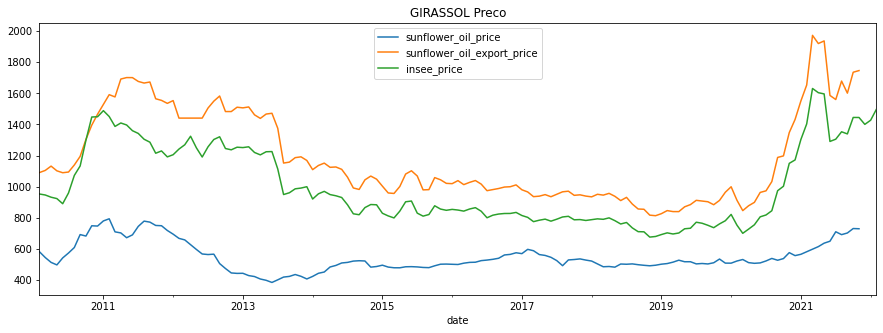

In [177]:
fig, axs = plt.subplots(figsize=(15,5))
df_sun.plot(ax = axs);
plt.title(f'GIRASSOL Preco');

In [178]:
from fredapi import Fred
fred = Fred(api_key='34226d58c6bcee68e056cb4c42b8f401')

df_temp = fred.get_series('PSUNOUSDM').to_frame()
df_temp.columns = ['fred_price']

df_sun = pd.merge(df_sun, df_temp, how="outer", left_index=True, right_index=True)
df_sun.tail()

,sunflower_oil_price,sunflower_oil_export_price,insee_price,fred_price
2021-10-01,732.051679,1735.49,1445.2,1735.490079
2021-11-01,730.673792,1746.12,1445.0,1746.120833
2021-12-01,NaN,NaN,1400.8,NaN
2022-01-01,NaN,NaN,1427.4,NaN
2022-02-01,NaN,NaN,1498.2,NaN


In [248]:
# https://www.sunflowernsa.com/growers/Marketing/daily-oilseed-sunflower-price/

import requests
from bs4 import BeautifulSoup

req = requests.get('https://www.sunflowernsa.com/growers/Marketing/daily-oilseed-sunflower-price/')
soup = BeautifulSoup(req.text)

In [220]:
tb = soup.find_all('table')[1]

In [251]:
tb = soup.find_all('table')[1]
df_temp = pd.read_html(str(tb))[0]
df_temp = df_temp.dropna(axis=1, how='all')
df_temp = df_temp.iloc[3:-3, :].copy()
df_temp = df_temp.dropna(axis=0, how='all')
df_temp = df_temp.replace(regex=[r'\$'], value='')
df_temp = df_temp.dropna(axis=1, how='all')
df_temp.columns = ['date', 'tipo1', 'tipo2', 'tipo3']
df_temp['date'] = pd.to_datetime(df_temp['date'], format='%m/%d/%Y')
df_temp.set_index('date', inplace=True)
df_temp = df_temp.astype(float)
df_temp.dtypes
df_temp['average'] = round(df_temp.mean(axis=1),2)
df_temp['price'] = df_temp['average'] * 19.6841

df_temp = df_temp[['price']]

df_temp = df_temp[df_temp.index > pd.to_datetime(THIS_YEAR, format=DATE_FORMAT)]
df_temp

,price
date,
2022-01-28,630.481723
2022-01-31,630.481723
2022-02-01,629.891200
2022-02-02,630.481723
2022-02-03,633.237497
2022-02-04,636.386953
2022-02-07,636.386953
2022-02-08,636.386953
2022-02-09,637.371158


,0,1,2,3,4,5
3,NaN,01/28/2022,NaN,$32.00,$32.60,$31.50
4,NaN,01/31/2022,NaN,$32.00,$32.60,$31.50
5,NaN,02/01/2022,NaN,$32.00,$32.50,$31.50
6,NaN,02/02/2022,NaN,$32.00,$32.60,$31.50
7,NaN,02/03/2022,NaN,$32.00,$33.00,$31.50
8,NaN,02/04/2022,NaN,$32.50,$33.00,$31.50
9,NaN,02/07/2022,NaN,$32.50,$33.00,$31.50
10,NaN,02/08/2022,NaN,$32.50,$33.00,$31.50
11,NaN,02/09/2022,NaN,$32.50,$33.15,$31.50
12,NaN,02/10/2022,NaN,$32.70,$33.15,$31.50


## Indice

- [Producer Price Index by Commodity: Farm Products: Sunflower (WPU01830161)](https://fred.stlouisfed.org/series/WPU01830161)


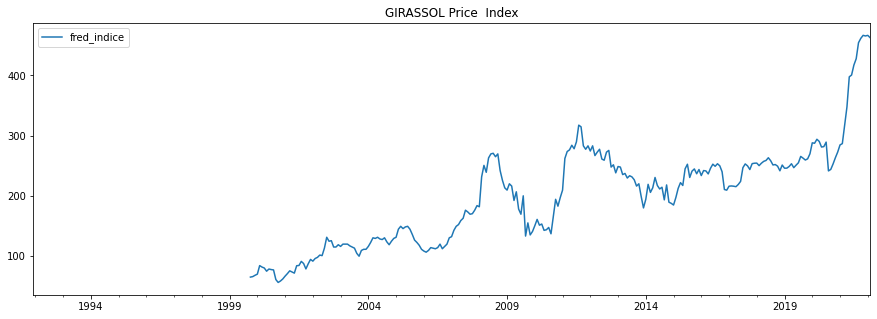

In [31]:
df_temp = fred.get_series('WPU01830161').to_frame()
df_temp.columns = ['fred_indice']

fig, axs = plt.subplots(figsize=(15,5))
df_temp.plot(ax = axs);
plt.title(f'GIRASSOL Price  Index');

## Producao

|indice|link|captura|
|---|---|---|
|US Sunflower Acres Planted|https://ycharts.com/indicators/us_sunflower_acres_planted|[data](https://ycharts.com/charts/fund_data.json?annotations=&annualizedReturns=false&calcs=&chartType=interactive&chartView=&correlations=&dateSelection=range&displayDateRange=false&displayTicker=false&endDate=&format=real&legendOnChart=false&note=&partner=basic_2000&quoteLegend=false&recessions=false&scaleType=linear&securities=id%3AI%3AUSSA50N8%2Cinclude%3Atrue%2C%2C&securityGroup=&securitylistName=&securitylistSecurityId=&source=false&splitType=single&startDate=&title=&units=false&useCustomColors=false&useEstimates=false&zoom=&redesign=true&chartCreator=&maxPoints=891)|
||||

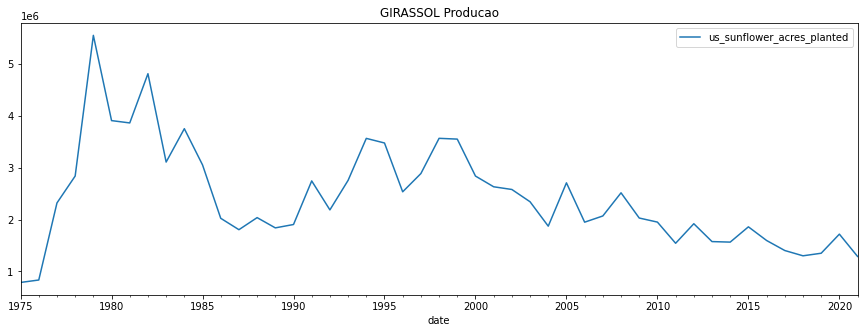

In [32]:
with open(f'{DATASET}/ychart_us_sunflower_acres_planted.json') as f:
    d = json.load(f)
    
df_temp = pd.DataFrame(d['chart_data'][0][0]['raw_data'], columns = ['date', 'us_sunflower_acres_planted'])
df_temp['date'] = pd.to_datetime(df_temp['date'], unit='ms')
df_temp.set_index('date', inplace=True)

fig, axs = plt.subplots(figsize=(15,5))
df_temp.plot(ax = axs);
plt.title(f'GIRASSOL Producao');

## Video

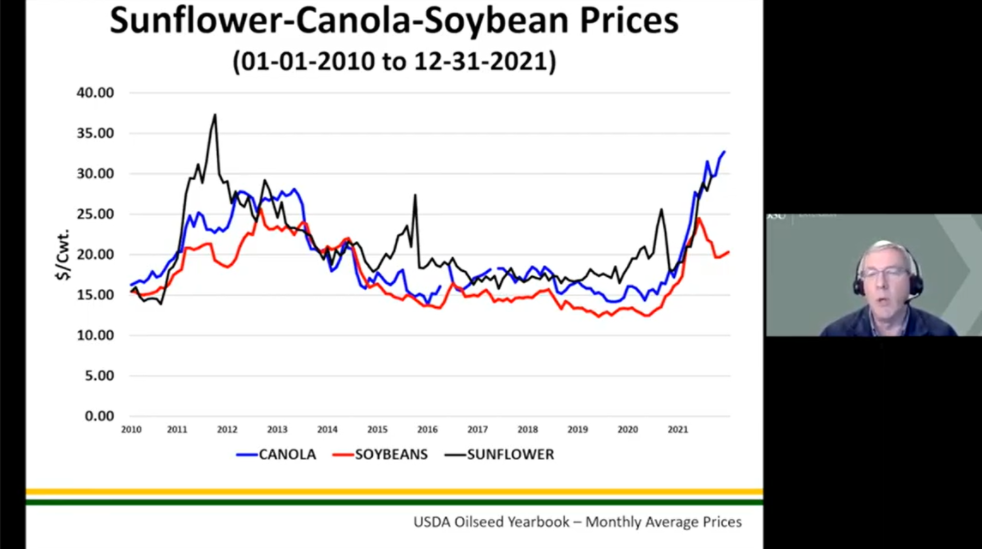
- https://www.youtube.com/watch?v=4Gvb7-ZMubM&list=PLSOmVfcVwGi1WvRinUWXtiXzPcB5tX-b6&index=10


Resumo:
- Preços medios nacionais por mês.
- Preços tendem a subir e descer juntos porque existem substitutos (não perfeitos) de cada um.
- Alta correlação entre Girassol e Canola (melhores substitutas entre eleas)
- Nos ultimos 12 meses... canola e girassol começaram a seperar /descolaram da Soja

# PRECOS INDEXMUNDI

- https://www.indexmundi.com/commodities/?commodity=rapeseed-oil&months=240

# Exogenas DataBank


- https://www.indexmundi.com/commodities/?commodity=rapeseed-oil&months=240

# CANOLA / Rapeseed

- https://www.investing.com/commodities/canola-futures-advanced-chart
- https://www.theice.com/products/251/Canola-Futures/data?marketId=6332824&span=3
- https://www.barchart.com/futures/quotes/RS*0/futures-prices
- https://tradingeconomics.com/commodity/canola
- https://albertacanola.com/daily-canola-prices/




Busca por COLZA
- https://live.euronext.com/en/product/commodities-futures/ECO-DPAR
- https://markets.businessinsider.com/commodities/rapeseed-price
- https://www.indexmundi.com/commodities/?commodity=rapeseed-oil&months=240
- https://fred.stlouisfed.org/series/PROILUSDM
- https://www.theglobaleconomy.com/World/rapeseed_oil_prices/

## Preços
https://www.neste.com/investors/market-data/palm-and-rapeseed-oil-prices#d0f6158b

In [33]:
# for f in investpy.search.search_quotes(text='soybean'):
#     print(f)
for f in investpy.search.search_quotes(text='canola'):
    print(f)

{"id_": 1176177, "name": "Eurolog Canola Socimi SA", "symbol": "MLCAN", "country": "france", "tag": "/equities/eurolog-canola-socimi", "pair_type": "stocks", "exchange": "Paris"}
{"id_": 961734, "name": "Canola Futures", "symbol": "RSc1", "country": null, "tag": "/commodities/canola-futures", "pair_type": "commodities", "exchange": "ICE"}
{"id_": 1178223, "name": "Canola Futures", "symbol": "RSc2", "country": null, "tag": "/commodities/canola-futures?cid=1178223", "pair_type": "commodities", "exchange": "ICE"}
{"id_": 1178224, "name": "Canola Futures", "symbol": "RSc3", "country": null, "tag": "/commodities/canola-futures?cid=1178224", "pair_type": "commodities", "exchange": "ICE"}


# Outros
## Linseed oil

- https://oec.world/en/profile/hs92/linseed-oil-crude
- https://commoprices.com/en/series/oil-and-fats/edible-oil/linseed-oil


# WORLD DATA / WorldBank

PREÇOS de COMMODITIES: 
- https://www.worldbank.org/en/research/commodity-markets gera o arquivo **CMO-Historical-Data-Monthly.xlsx**

Outros
- Login: https://databank.worldbank.org/home
- Report: https://databank.worldbank.org/reports.aspx?ReportId=136800&Type=Table

# Mercado Global de Oleo - OECD

**OECD - Organisation for Economic Co-operation and Development**

- https://stats.oecd.org/index.aspx?r=283777
- https://stats.oecd.org/index.aspx?r=524738



### Inicializacao

In [13]:
df_oecd = pd.read_csv(f'{DATASET}/HIGH_AGLINK_2021_16032022104718005.csv')

COUNTRIES   = ['Brazil', 'Argentina', 'United States', 'Canada', 'Russian Federation', 'Ukraine', 'China', 'India', 'Indonesia', 'Malaysia']
IGNORE_COUNTRIES = ['WORLD', 'DEVELOPING COUNTRIES', 'ASIA', 'BRICS', 'DEVELOPED COUNTRIES', 'OECD countries',
                                  'EUROPE', 'LATIN AMERICA', 'NORTH AMERICA', 'European Union', 'AFRICA', 'OCEANIA']

def oecd(commodity, 
         variable, 
         location=None,
         tipo=0):
    
    commodity = commodity.strip()
    variable = variable.strip()
    location = location.strip().upper() if location is not None else None
    
    if location is None:
        df = df_oecd[    ((df_oecd['COMMODITY']==commodity) | (df_oecd['Commodity']==commodity)) & 
                         ((df_oecd['VARIABLE']==variable) | (df_oecd['Variable']==variable)) ].copy()

        if df.shape[0]>100:
            raise Exception('Defina um location')
    
    else:
        df = df_oecd[    ((df_oecd['COMMODITY']==commodity) | (df_oecd['Commodity']==commodity)) & 
                         ((df_oecd['VARIABLE']==variable) | (df_oecd['Variable']==variable)) &
                         ((df_oecd['LOCATION']==location) | (df_oecd['Country'].str.upper()==location))].copy()
    
    df['ref_date'] = df['Time'].astype(str) + '-' + str(REF_MES)
    df['ref_date'] = pd.to_datetime(df['ref_date'], format='%Y-%m')

    if df.shape[0]>100:
        raise Exception('Defina um location')
        
    df = df.set_index('ref_date', drop=True)
    if tipo == 0:
        return df[['Value', 'Unit', 'Commodity', 'Variable', 'Country']]
    
    elif tipo == 10:
        location = df['Country'].unique()[0]
        return df[['Value','Unit', 'Commodity', 'Variable']].rename(columns={"Value": location.title()})
    
    elif tipo == 11:
        location = df['Country'].unique()[0]
        return df[['Value']].rename(columns={"Value": location.title()})
    

    
    elif tipo == 20:
        commodity = df['Commodity'].unique()[0]
        return df[['Value','Unit', 'Commodity', 'Variable']].rename(columns={"Value": commodity.title()})

    elif tipo == 21:
        commodity = df['Commodity'].unique()[0]
        return df[['Value']].rename(columns={"Value": commodity.title()})
    
    else:
    
        return df

# oecd(commodity='Soybean', variable='Production', location='world')
# oecd(commodity='Soybean', variable='World Price', tipo=1)#['Country'].unique()[0]

# df_soja_producao = oecd(commodity='Soybean', variable='Production', location='world', tipo=20)
# df_soja_producao = pd.merge(df_soja_producao,
#                             oecd(commodity='Vegetable oils', variable='Production', location='world', tipo=21), 
#                             how="left", left_index=True, right_index=True)

# df_soja_producao

In [14]:
def oecd_grouped(commodity, variable, year, COUNTRIES = COUNTRIES):
    df_producao_por_pais = df_oecd[(df_oecd['Commodity']==commodity) & 
            (df_oecd['Variable']==variable) & 
            (df_oecd['TIME']==year) &
            (df_oecd['Country'].isin(COUNTRIES))
           ].groupby(by=['Country','TIME']).sum(['Value']).sort_values(by='Value')

    df_producao_por_pais_others = df_oecd[(df_oecd['Commodity']==commodity) & 
            (df_oecd['Variable']==variable) & 
            (df_oecd['TIME']==year) &
            ~(df_oecd['Country'].isin(COUNTRIES)) &
            ~(df_oecd['Country'].isin(IGNORE_COUNTRIES))
           ].groupby(by=['TIME']).sum(['Value']).sort_values(by='Value', ascending=False )

    df_producao_por_pais_others.rename(index={year:('Other Countries', year)}, inplace=True)
    

    df_producao_por_pais = pd.concat([df_producao_por_pais, df_producao_por_pais_others], ignore_index=False)
    
    return df_producao_por_pais

### Identificando Atributos

In [36]:
df_oecd.groupby(by=['Commodity','COMMODITY']).size()

Commodity            COMMODITY
Agricultural sector  AGR           1927
Biodiesel            BD           11590
Oil                  OIL             41
Other oilseeds       OOS          38565
Soybean              SB           38567
Total                TOT           5781
Vegetable oils       VL           32781
dtype: int64

In [37]:
df_oecd.groupby(by=['Variable','VARIABLE']).size()

Variable                             VARIABLE     
Area harvested                       AH               3854
Biodiesel production from commodity  QP__BD           5781
Biofuel use                          BF               5781
Consumption                          QC               7700
Crush                                CR               3853
Direct GHG emission                  ECOE__TOT        7708
Ending stocks                        ST               7705
Ethanol production from commodity    QP__ET           5781
Exports                              EX               7706
Feed                                 FE               5779
Food                                 FO               5776
Food Fat availability                FO__DFS__FAT     7708
Food Protein availability            FO__DFS__PROT    7708
Human consumption per capita         FO__PC           5781
Imports                              IM               7703
Other use                            OU               5781
Produ

## Precos OECD

Coerente quando se converte para USD/Bushel ($459.082\div36.7437\times100 => 1239.41$)

In [38]:
oecd(commodity='Soybean', variable='World Price').tail()

,Value,Unit,Commodity,Variable,Country
ref_date,,,,,
2026-12-01,468.725,US Dollar per tonne,Soybean,World Price,WORLD
2027-12-01,474.710,US Dollar per tonne,Soybean,World Price,WORLD
2028-12-01,484.171,US Dollar per tonne,Soybean,World Price,WORLD
2029-12-01,487.133,US Dollar per tonne,Soybean,World Price,WORLD
2030-12-01,494.198,US Dollar per tonne,Soybean,World Price,WORLD


## OECD - Indice de Preços de Oleo Vegetal
Aqui trouxe um indice mensal da FAO e um indice anual com forecast da OECD

In [39]:
df_world_oil = oecd(commodity='Vegetable oils', variable='World Price', location='world', tipo=-2)
df_world_oil.head(2)

,LOCATION,Country,COMMODITY,Commodity,VARIABLE,Variable,TIME,Time,Unit Code,Unit,PowerCode Code,PowerCode,Reference Period Code,Reference Period,Value,Flag Codes,Flags
ref_date,,,,,,,,,,,,,,,,,
1990-12-01,WLD,WORLD,VL,Vegetable oils,XP,World Price,1990,1990,USD_TONNE,US Dollar per tonne,0,Units,NaN,NaN,418.736,NaN,NaN
1991-12-01,WLD,WORLD,VL,Vegetable oils,XP,World Price,1991,1991,USD_TONNE,US Dollar per tonne,0,Units,NaN,NaN,422.016,NaN,NaN


### FAO - Food and Agriculture Organization

Indice mensal dos precos de oleo. Não tem forecast.
- https://www.fao.org/markets-and-trade/publications/en/?querystring=oilseeds
- https://www.fao.org/markets-and-trade/commodities/oilcrops/fao-price-indices-for-oilseeds-vegetable-oils-and-oilmeals/en/ gera o arquivo excel.xlsx e mudo o nome para **FAO_excel.xlsx**.


O indice de preços FAO segue **Laspeyres** conforme https://iussp.org/sites/default/files/Shirley_Mustafa_FFPI.pdf

In [40]:
df_fao = pd.read_excel(f'{DATASET}/FAO_excel.xlsx')
df_fao.dropna(how='all', inplace=True)
df_fao.dropna(how='all', axis=1, inplace=True)
df_fao.reset_index(inplace=True, drop=True)
df_fao.iloc[:,:-1].tail(3)

,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
162,2020.0,108.732526,97.553345,85.424837,81.177563,77.768867,86.613654,93.200415,98.701829,104.596344,106.450248,121.90345,131.199351
163,2021.0,138.874538,147.462482,159.302011,162.191331,174.875921,157.680528,155.495528,165.862297,168.570864,184.837471,184.555179,178.505442
164,2022.0,185.931442,201.700194,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
_df_fao = {}
for i, row in df_fao.iloc[:,:-1].iterrows():
    year = df_fao.iloc[i,0]
    if 'January' in list(row) and 'February' in list(row):
        name = ''.join(list(df_fao.iloc[i-1].fillna(''))[:-1])
        name = name.split('(')[0].replace('Monthly index','').replace('data','').strip()
        
        months = [datetime.strptime(f'{m}', '%B').strftime('%m') for m in list(row)[1:] ]
        
        columns = ['year'] + months
        df = pd.DataFrame(columns=columns)
        _df_fao[name] = df
    elif not pd.isnull(year) :
        # _df_fao[name] = pd.concat([_df_fao[name], list(row)], ignore_index=True)
        # _df_fao[name].append(row, ignore_index=True)
        _df_fao[name].loc[len(_df_fao[name])] = list(row)


In [42]:
_df_fao['vegetable oils'].tail(3)

,year,01,02,03,04,05,06,07,08,09,10,11,12
50,2020.0,108.732526,97.553345,85.424837,81.177563,77.768867,86.613654,93.200415,98.701829,104.596344,106.450248,121.903450,131.199351
51,2021.0,138.874538,147.462482,159.302011,162.191331,174.875921,157.680528,155.495528,165.862297,168.570864,184.837471,184.555179,178.505442
52,2022.0,185.931442,201.700194,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
df_fao_vegetable_oils = pd.melt(_df_fao['vegetable oils'], id_vars=['year'])
df_fao_vegetable_oils = df_fao_vegetable_oils.sort_values(by=['year', 'variable'], ascending=[True, True])

df_fao_vegetable_oils['ref_date'] = df_fao_vegetable_oils["year"].astype(int).astype(str) + '-' + df_fao_vegetable_oils["variable"]
df_fao_vegetable_oils['ref_date'] = pd.to_datetime(df_fao_vegetable_oils['ref_date'], format='%Y-%m')

df_fao_vegetable_oils = df_fao_vegetable_oils.dropna().set_index('ref_date', drop=True)
df_fao_vegetable_oils = df_fao_vegetable_oils[df_fao_vegetable_oils['year'] >= 1990]
df_fao_vegetable_oils

,year,variable,value
ref_date,,,
1990-01-01,1990.0,01,44.587672
1990-02-01,1990.0,02,44.500514
1990-03-01,1990.0,03,45.745434
1990-04-01,1990.0,04,44.017094
1990-05-01,1990.0,05,45.499631
...,...,...,...
2021-10-01,2021.0,10,184.837471
2021-11-01,2021.0,11,184.555179
2021-12-01,2021.0,12,178.505442


### Grafico  Indice de Preços FAO X OECD

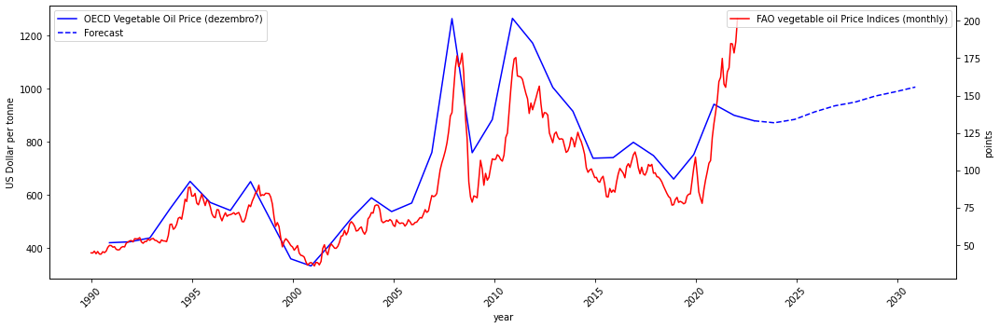

In [44]:
fig, ax1 = plt.subplots(figsize=(15,5))

ax1.plot(df_world_oil.query(f"TIME<={TODAY.year}").index,
         df_world_oil.query(f"TIME<={TODAY.year}")['Value'], label='OECD Vegetable Oil Price (dezembro?)', color='b' );

ax1.plot(df_world_oil.query(f"TIME>={TODAY.year}").index,
         df_world_oil.query(f"TIME>={TODAY.year}")['Value'], label='Forecast', color='b', linestyle='dashed' );

ax1.set_xlabel('year') 
ax1.set_ylabel(df_world_oil['Unit'].unique()[0]) 

plt.xticks(rotation = 45)
ax2 = ax1.twinx()

ax2.plot(df_fao_vegetable_oils.index,
         df_fao_vegetable_oils['value'], label='FAO vegetable oil Price Indices (monthly)', color='r' );
ax2.set_ylabel('points')

ax1.legend(loc='upper left');
ax2.legend(loc='upper right');

fig.set_tight_layout(True)

## Producao de Oleogionasas - OECD

In [45]:
df_producao = oecd(commodity='Soybean', variable='Production', location='world', tipo=20)

df_producao = pd.merge(df_producao,
                            oecd(commodity='Vegetable oils', variable='Production', location='world', tipo=21), 
                            how="left", left_index=True, right_index=True)

df_producao = pd.merge(df_producao,
                            oecd(commodity='Other oilseeds', variable='Production', location='world', tipo=21), 
                            how="left", left_index=True, right_index=True)


df_producao.tail()

,Soybean,Unit,Commodity,Variable,Vegetable Oils,Other Oilseeds
ref_date,,,,,,
2026-12-01,394797.232,Tonnes,Soybean,Production,235437.181,171147.823
2027-12-01,399148.031,Tonnes,Soybean,Production,238242.998,173321.415
2028-12-01,402910.813,Tonnes,Soybean,Production,241056.074,175237.885
2029-12-01,407463.415,Tonnes,Soybean,Production,244038.742,177430.806
2030-12-01,411051.918,Tonnes,Soybean,Production,246941.153,179493.430


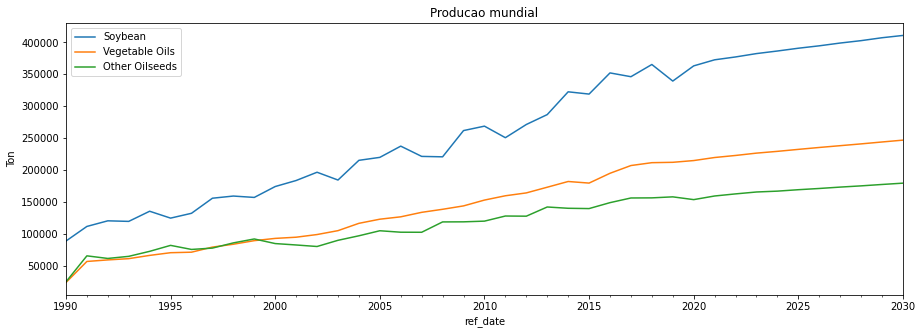

In [46]:
fig, axs = plt.subplots(figsize=(15,5))
df_producao.plot(ax = axs);
plt.title("Producao mundial")
axs.set_ylabel("Ton");

## Producao de Oleo Vegetal por pais

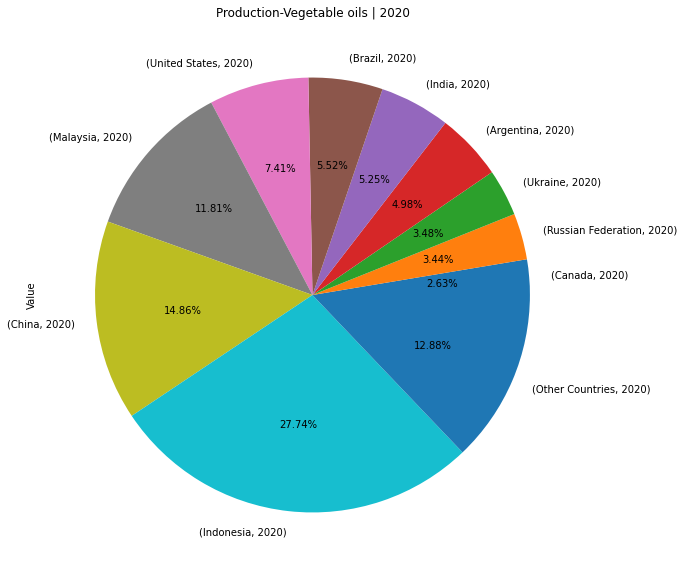

In [47]:
commodity = 'Vegetable oils'
variable = 'Production'
year = 2020

df = oecd_grouped(commodity, variable, year)
df.plot.pie(y='Value', figsize=(10,10), legend=None, 
              autopct='%1.2f%%', 
              title=f'{variable}-{commodity} | {year}');


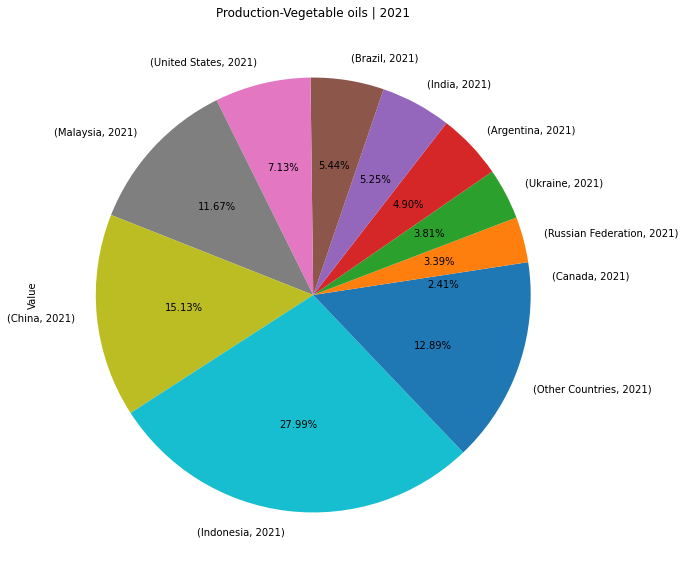

In [48]:
year = 2021
df = oecd_grouped(commodity, variable, year)
df.plot.pie(y='Value', figsize=(10,10), legend=None, 
              autopct='%1.2f%%', 
              title=f'{variable}-{commodity} | {year}');

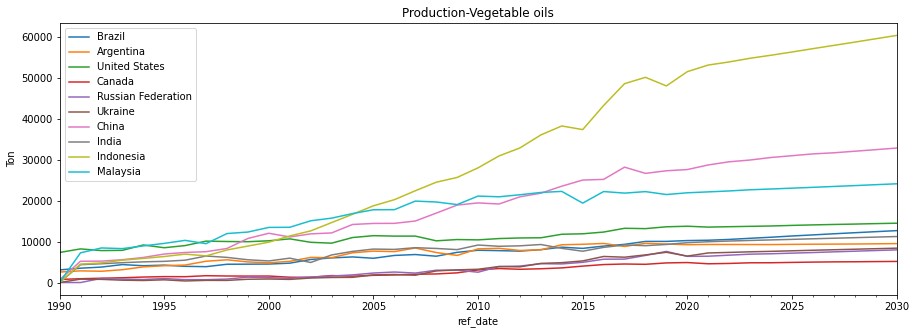

In [49]:
df = oecd(commodity=commodity, variable=variable, location='world', tipo=10)
for country in COUNTRIES:
    df = pd.merge(df,  oecd(commodity=commodity, variable=variable, location=country, tipo=11), 
                how="left", left_index=True, right_index=True)

fig, axs = plt.subplots(figsize=(15,5))
df.iloc[:,1:].plot(ax = axs);
plt.title(f'{variable}-{commodity}')
axs.set_ylabel("Ton");

## Consumo Oleo Vegetal exportacao - OECD

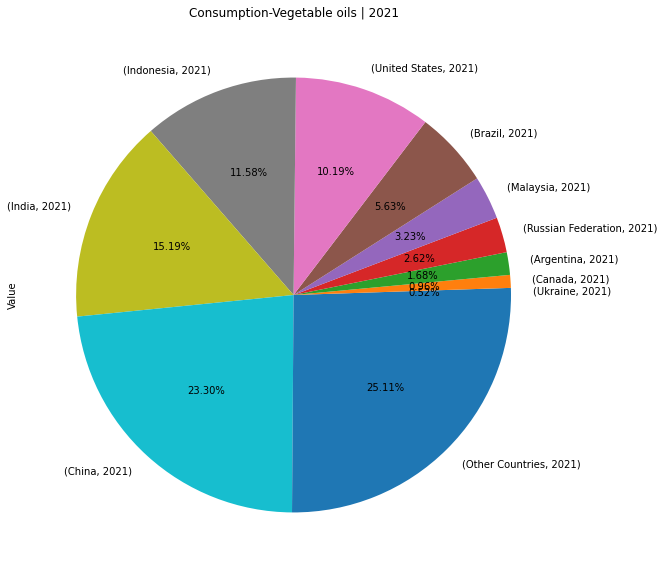

In [50]:
commodity = 'Vegetable oils'
variable = 'Consumption'
year = 2021

df = oecd_grouped(commodity, variable, year)
df.plot.pie(y='Value', figsize=(10,10), legend=None, 
              autopct='%1.2f%%', 
              title=f'{variable}-{commodity} | {year}');


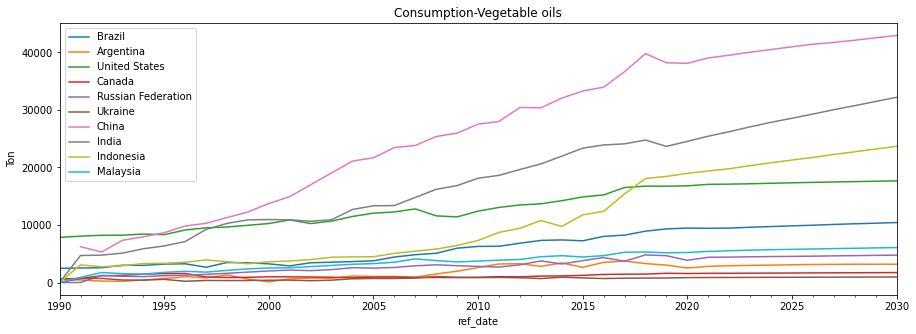

In [51]:
df = oecd(commodity=commodity, variable=variable, location='world', tipo=10)
for country in COUNTRIES:
    df = pd.merge(df,  oecd(commodity=commodity, variable=variable, location=country, tipo=11), 
                how="left", left_index=True, right_index=True)

fig, axs = plt.subplots(figsize=(15,5))
df.iloc[:,1:].plot(ax = axs);
plt.title(f'{variable}-{commodity}')
axs.set_ylabel("Ton");

## Consumo Per/Capita Oleo Vegetal - OECD

In [52]:
commodity = 'Vegetable oils'
variable = 'Human consumption per capita'
year = 2021

df_group = df_oecd[(df_oecd['Commodity']==commodity) & 
        (df_oecd['Variable']==variable) & 
        (df_oecd['TIME']==year) & 
        ~(df_oecd['Country'].isin(IGNORE_COUNTRIES))
       ].groupby(by=['Country','TIME']).sum(['Value']).sort_values(by='Value' , ascending=False)

# df.plot.pie(y='Value', figsize=(10,10), legend=None, 
#               autopct='%1.2f%%', 
#               title=f'{variable}-{commodity} | {year}');
# df.reset_index)
df_group.head()

,,Time,PowerCode Code,Reference Period Code,Reference Period,Value,Flag Codes,Flags
Country,TIME,,,,,,,
Norway,2021,2021,0,0.0,0.0,43.326,0.0,0.0
United States,2021,2021,0,0.0,0.0,39.993,0.0,0.0
Canada,2021,2021,0,0.0,0.0,38.164,0.0,0.0
Russian Federation,2021,2021,0,0.0,0.0,30.080,0.0,0.0
United Kingdom,2021,2021,0,0.0,0.0,28.372,0.0,0.0


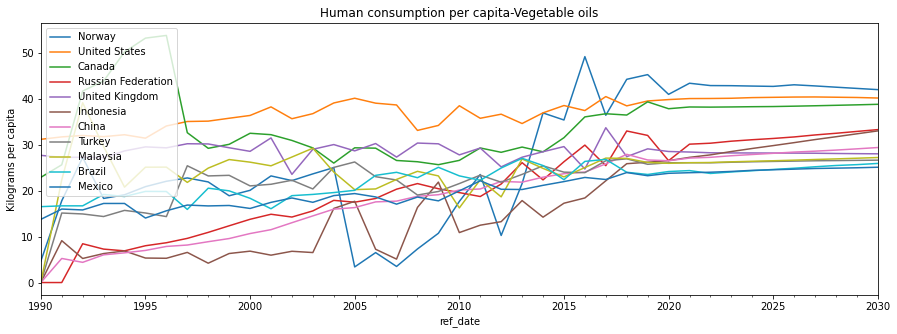

In [53]:
df = oecd(commodity=commodity, variable=variable, location='world', tipo=10)
for i, row in df_group[:].iterrows():
    country = i[0]
    df = pd.merge(df,  oecd(commodity=commodity, variable=variable, location=country, tipo=11), 
                how="left", left_index=True, right_index=True)

fig, axs = plt.subplots(figsize=(15,5))
df.iloc[:,1:15].plot(ax = axs);
plt.title(f'{variable}-{commodity}')
axs.set_ylabel(df['Unit'].unique()[0]);

In [54]:
df.tail()

,World,Unit,Commodity,Variable,Norway,United States,Canada,Russian Federation,United Kingdom,Indonesia,...,Philippines,South Africa,India,Peru,Chile,Nigeria,Iran,Egypt,Ethiopia,Viet Nam
ref_date,,,,,,,,,,,,,,,,,,,,,
2026-12-01,19.258,Kilograms per capita,Vegetable oils,Human consumption per capita,42.989,40.322,38.339,31.651,28.136,30.413,...,15.003,14.158,12.842,11.693,11.548,10.871,10.486,8.679,5.221,3.204
2027-12-01,19.397,Kilograms per capita,Vegetable oils,Human consumption per capita,42.742,40.343,38.429,32.084,28.109,31.080,...,15.216,14.351,13.174,11.800,11.632,10.908,10.526,8.801,5.306,3.293
2028-12-01,19.547,Kilograms per capita,Vegetable oils,Human consumption per capita,42.467,40.285,38.529,32.448,28.054,31.697,...,15.401,14.523,13.488,11.891,11.702,10.925,10.558,8.906,5.379,3.378
2029-12-01,19.687,Kilograms per capita,Vegetable oils,Human consumption per capita,42.201,40.229,38.630,32.850,28.016,32.331,...,15.597,14.704,13.807,11.988,11.767,10.944,10.598,9.013,5.453,3.466
2030-12-01,19.855,Kilograms per capita,Vegetable oils,Human consumption per capita,41.934,40.113,38.746,33.246,27.984,32.966,...,15.791,14.882,14.131,12.087,11.827,10.959,10.641,9.116,5.525,3.555


## Exportacao Oleo Vegetal - OECD

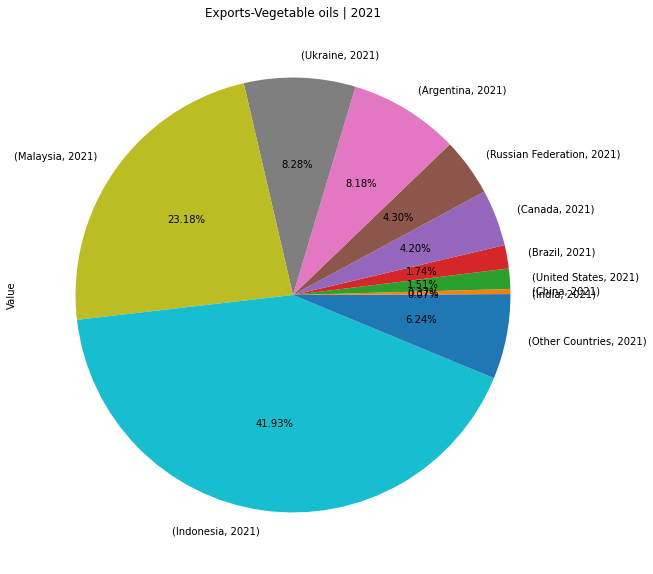

In [55]:
commodity = 'Vegetable oils'
variable = 'Exports'
year = 2021

df = oecd_grouped(commodity, variable, year)
df.plot.pie(y='Value', figsize=(10,10), legend=None, 
              autopct='%1.2f%%', 
              title=f'{variable}-{commodity} | {year}');


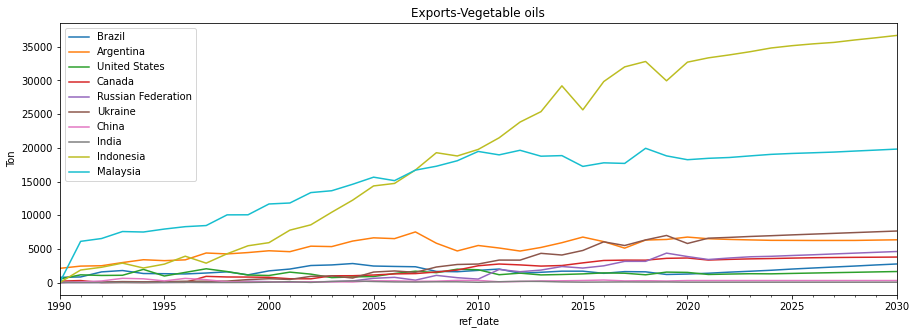

In [56]:
df = oecd(commodity=commodity, variable=variable, location='world', tipo=10)
for country in COUNTRIES:
    df = pd.merge(df,  oecd(commodity=commodity, variable=variable, location=country, tipo=11), 
                how="left", left_index=True, right_index=True)

fig, axs = plt.subplots(figsize=(15,5))
df.iloc[:,1:].plot(ax = axs);
plt.title(f'{variable}-{commodity}')
axs.set_ylabel("Ton");

## Estoques (??) Oleo Vegetal - OECD

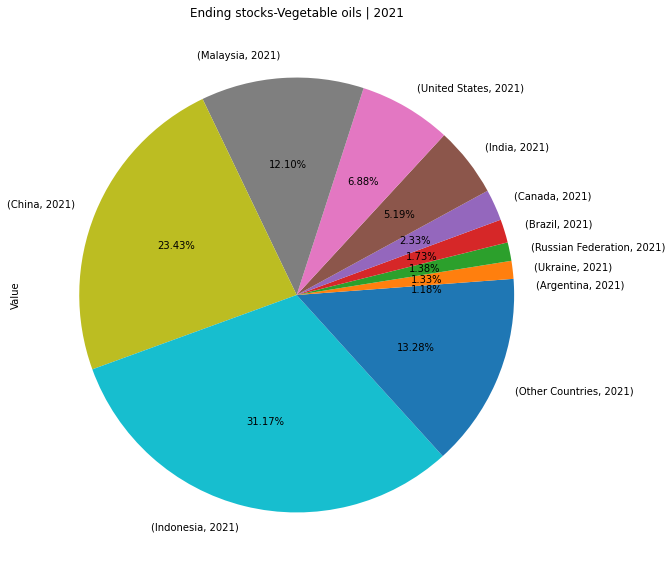

In [57]:
commodity = 'Vegetable oils'
variable = 'Ending stocks'
year = 2021

df = oecd_grouped(commodity, variable, year)
df.plot.pie(y='Value', figsize=(10,10), legend=None, 
              autopct='%1.2f%%', 
              title=f'{variable}-{commodity} | {year}');


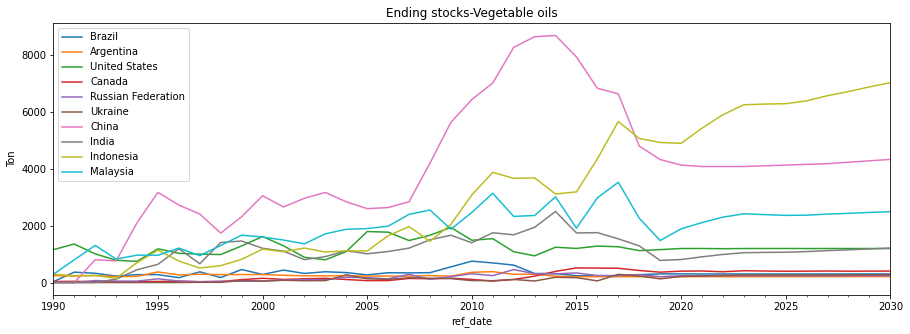

In [58]:
df = oecd(commodity=commodity, variable=variable, location='world', tipo=10)
for country in COUNTRIES:
    df = pd.merge(df,  oecd(commodity=commodity, variable=variable, location=country, tipo=11), 
                how="left", left_index=True, right_index=True)

fig, axs = plt.subplots(figsize=(15,5))
df.iloc[:,1:].plot(ax = axs);
plt.title(f'{variable}-{commodity}')
axs.set_ylabel("Ton");

## Importacao Oleo Vegetal - OECD

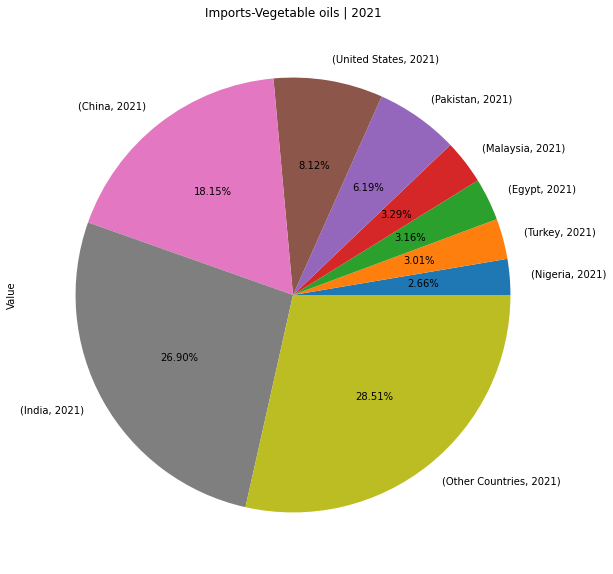

In [59]:
commodity = 'Vegetable oils'
variable = 'Imports'
year = 2021
ref_COUNTRIES = ['India','China', 'United States', 'Pakistan', 'Malaysia', 'Egypt', 'Turkey', 'Nigeria']

df = oecd_grouped(commodity, variable, year, COUNTRIES=ref_COUNTRIES)
df.plot.pie(y='Value', figsize=(10,10), legend=None, 
              autopct='%1.2f%%', 
              title=f'{variable}-{commodity} | {year}');


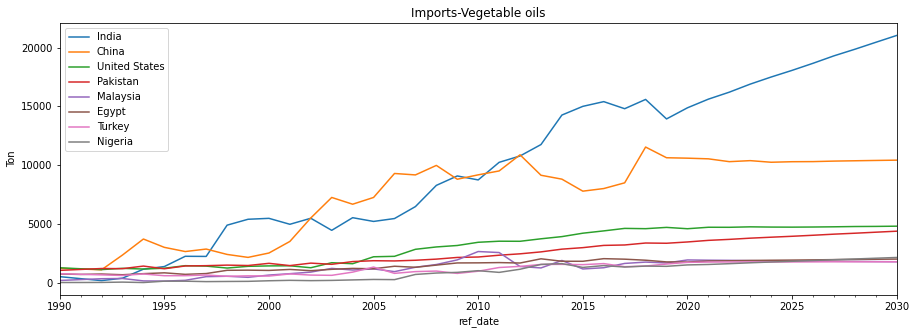

In [60]:
df = oecd(commodity=commodity, variable=variable, location='world', tipo=10)
for country in ref_COUNTRIES:
    df = pd.merge(df,  oecd(commodity=commodity, variable=variable, location=country, tipo=11), 
                how="left", left_index=True, right_index=True)

fig, axs = plt.subplots(figsize=(15,5))
df.iloc[:,1:].plot(ax = axs);
plt.title(f'{variable}-{commodity}')
axs.set_ylabel("Ton");

## OECD Base Ranking

In [61]:
df = df_oecd[(df_oecd['Commodity']==commodity) & 
        (df_oecd['Variable']=='Consumption') & 
        (df_oecd['TIME']==year) & 
        ~(df_oecd['Country'].isin(IGNORE_COUNTRIES))
       ].groupby(by=['Country','TIME']).sum(['Value']).sort_values(by='Value' , ascending=False)

df.head()


,,Time,PowerCode Code,Reference Period Code,Reference Period,Value,Flag Codes,Flags
Country,TIME,,,,,,,
China,2021,2021,3,0.0,0.0,39033.397,0.0,0.0
India,2021,2021,3,0.0,0.0,25438.056,0.0,0.0
Indonesia,2021,2021,3,0.0,0.0,19393.956,0.0,0.0
United States,2021,2021,3,0.0,0.0,17064.648,0.0,0.0
Brazil,2021,2021,3,0.0,0.0,9428.301,0.0,0.0


# Mercado Global de Oleo - USDA

**USDA - United States Department of Agriculture**

- https://apps.fas.usda.gov/esrquery/
- https://apps.fas.usda.gov/psdonline/app/index.html#/app/downloads


### Inicializacao

In [62]:
df_usda = pd.read_csv('https://apps.fas.usda.gov/psdonline/downloads/psd_oilseeds_csv.zip')
# df_usda = pd.read_csv('psd_oilseeds.csv')
print(df_usda.shape)
df_usda.tail()

(732918, 12)


,Commodity_Code,Commodity_Description,Country_Code,Country_Name,Market_Year,Calendar_Year,Month,Attribute_ID,Attribute_Description,Unit_ID,Unit_Description,Value
732913,2224000,"Oilseed, Sunflowerseed",UZ,Uzbekistan,2021,2022,3,57,Imports,8,(1000 MT),100.00
732914,2224000,"Oilseed, Sunflowerseed",UZ,Uzbekistan,2021,2022,3,28,Production,8,(1000 MT),38.00
732915,2224000,"Oilseed, Sunflowerseed",UZ,Uzbekistan,2021,2022,3,178,Total Distribution,8,(1000 MT),159.00
732916,2224000,"Oilseed, Sunflowerseed",UZ,Uzbekistan,2021,2022,3,86,Total Supply,8,(1000 MT),159.00
732917,2224000,"Oilseed, Sunflowerseed",UZ,Uzbekistan,2021,2022,3,184,Yield,26,(MT/HA),3.17


In [63]:
df_usda['ref_date'] = pd.to_datetime(df_usda['Market_Year'].astype(str) + df_usda['Month'].astype(str),  format='%Y%m')
df_usda.tail()

,Commodity_Code,Commodity_Description,Country_Code,Country_Name,Market_Year,Calendar_Year,Month,Attribute_ID,Attribute_Description,Unit_ID,Unit_Description,Value,ref_date
732913,2224000,"Oilseed, Sunflowerseed",UZ,Uzbekistan,2021,2022,3,57,Imports,8,(1000 MT),100.00,2021-03-01
732914,2224000,"Oilseed, Sunflowerseed",UZ,Uzbekistan,2021,2022,3,28,Production,8,(1000 MT),38.00,2021-03-01
732915,2224000,"Oilseed, Sunflowerseed",UZ,Uzbekistan,2021,2022,3,178,Total Distribution,8,(1000 MT),159.00,2021-03-01
732916,2224000,"Oilseed, Sunflowerseed",UZ,Uzbekistan,2021,2022,3,86,Total Supply,8,(1000 MT),159.00,2021-03-01
732917,2224000,"Oilseed, Sunflowerseed",UZ,Uzbekistan,2021,2022,3,184,Yield,26,(MT/HA),3.17,2021-03-01


### Identificando Atributos

In [64]:
df_usda.dtypes

Commodity_Code                    int64
Commodity_Description            object
Country_Code                     object
Country_Name                     object
Market_Year                       int64
Calendar_Year                     int64
Month                             int64
Attribute_ID                      int64
Attribute_Description            object
Unit_ID                           int64
Unit_Description                 object
Value                           float64
ref_date                 datetime64[ns]
dtype: object

In [65]:
df_usda.groupby(by=['Attribute_Description', 'Attribute_ID']).size()

Attribute_Description  Attribute_ID
Area Harvested         4               15789
Beginning Stocks       20              55333
Catch For Reduction    5                1992
Crush                  7               48282
Domestic Consumption   125             55333
Ending Stocks          176             55333
Exports                88              55333
Extr. Rate, 999.9999   181             34879
Feed Waste Dom. Cons.  161             55333
Food Use Dom. Cons.    149             55333
Imports                57              55333
Industrial Dom. Cons.  140             39939
Production             28              55333
SME                    194             17388
Seed to Lint Ratio     183              2153
Total Distribution     178             55333
Total Supply           86              55333
Yield                  184             19166
dtype: int64

In [66]:
df_usda.groupby(by=['Commodity_Code','Commodity_Description']).size()

Commodity_Code  Commodity_Description   
813100          Meal, Soybean               60228
813101          Meal, Soybean (Local)        1624
813200          Meal, Peanut                23926
813300          Meal, Cottonseed            36638
813500          Meal, Sunflowerseed         25088
813600          Meal, Rapeseed              26152
813700          Meal, Copra                 20300
813800          Meal, Palm Kernel           21588
814200          Meal, Fish                  27888
2221000         Oilseed, Peanut             35945
2222000         Oilseed, Soybean            44577
2222001         Oilseed, Soybean (Local)     1508
2223000         Oilseed, Cottonseed         30142
2224000         Oilseed, Sunflowerseed      23400
2226000         Oilseed, Rapeseed           22802
2231000         Oilseed, Copra              21084
2232000         Oilseed, Palm Kernel        19440
4232000         Oil, Soybean                56238
4232001         Oil, Soybean (Local)         1508
4233000  

## Mercado EXPORTACAO - USDA

### Tipos de OLEOS

In [67]:
df_oil = df_usda[(df_usda.Commodity_Code.between(4232000, 4244000)) & (df_usda.Attribute_ID.isin([88]) )]
df_oil.shape

(22551, 13)

In [68]:
df = df_oil.groupby(by=['Commodity_Code', 'Commodity_Description', 'Unit_Description' ])['Value'].sum().to_frame()
df.sort_values(['Value'], ascending=[False])


,,,Value
Commodity_Code,Commodity_Description,Unit_Description,
4243000,"Oil, Palm",(1000 MT),1000358.0
4232000,"Oil, Soybean",(1000 MT),331534.0
4232001,"Oil, Soybean (Local)",(1000 MT),193753.0
4236000,"Oil, Sunflowerseed",(1000 MT),192295.0
4239100,"Oil, Rapeseed",(1000 MT),107165.0
4242000,"Oil, Coconut",(1000 MT),82382.0
4244000,"Oil, Palm Kernel",(1000 MT),77145.0
4235000,"Oil, Olive",(1000 MT),31030.0
4233000,"Oil, Cottonseed",(1000 MT),15669.0


### TODOS os tipos de Oleo Vegetal

In [69]:
mkt_oil = df_oil.groupby(by=['Market_Year', 'Commodity_Code', 'Commodity_Description', 'Unit_Description' ])['Value'].sum().to_frame()

mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Commodity_Description', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])
mkt_oil

Commodity_Code Unit_Description   Value  \
Commodity_Description Market_Year                                            
Oil, Palm Kernel      1961                4244000        (1000 MT)     1.0   
                      1962                4244000        (1000 MT)     1.0   
                      1963                4244000        (1000 MT)     1.0   
Oil, Soybean          1964                4232000        (1000 MT)   779.0   
Oil, Palm             1964                4243000        (1000 MT)   600.0   
...                                           ...              ...     ...   
Oil, Palm Kernel      2021                4244000        (1000 MT)  3398.0   
Oil, Coconut          2021                4242000        (1000 MT)  1933.0   
Oil, Olive            2021                4235000        (1000 MT)  1463.0   
Oil, Peanut           2021                4234000        (1000 MT)   398.0   
Oil, Cottonseed       2021                4233000        (1000 MT)   105.0   

                                    mkt_share  
Commodity_Description Market_Year              
Oil, Palm Kernel      1961         100.000000  
                      1962         100.000000  
                      1963         100.000000  
Oil, Soybean          1964          36.215714  
Oil, Palm             1964          27.894003  
...                                       ...  
Oil, Palm Kernel      2021           3.590145  
Oil, Coconut          2021           2.042304  
Oil, Olive            2021           1.545727  
Oil, Peanut           2021           0.420505  
Oil, Cottonseed       2021           0.110937  

[573 rows x 4 columns]

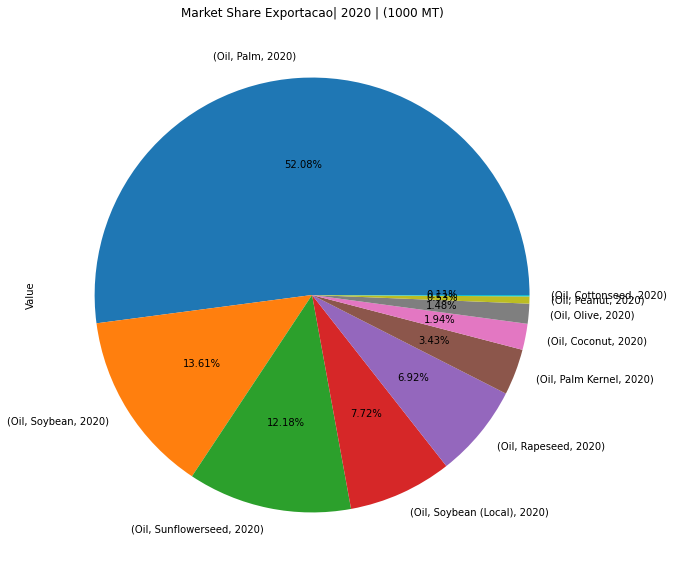

In [70]:
year = 2020
mkt_oil[mkt_oil.index.get_level_values(1) == year].plot.pie(y='Value', figsize=(10,10), legend=None, 
              autopct='%1.2f%%', 
              title=f'Market Share Exportacao| {year} | {mkt_oil["Unit_Description"].unique()[0]}');


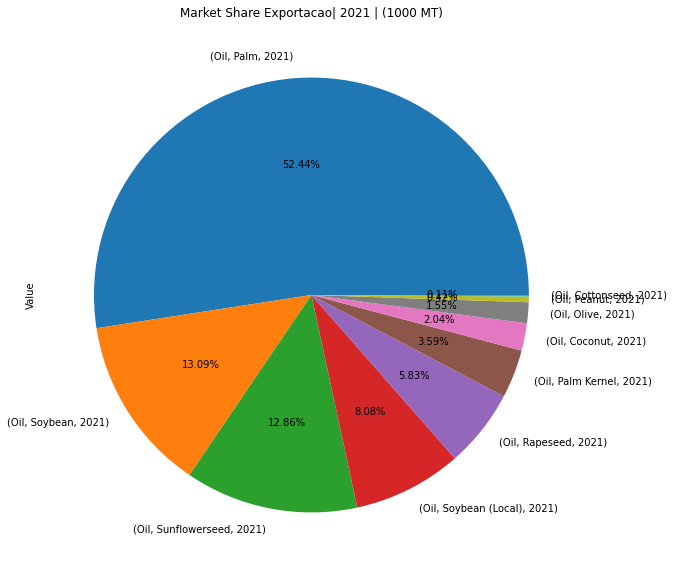

In [71]:
year = 2021
mkt_oil[mkt_oil.index.get_level_values(1) == year].plot.pie(y='Value', figsize=(10,10), legend=None, 
              autopct='%1.2f%%', 
              title=f'Market Share Exportacao| {year} | {mkt_oil["Unit_Description"].unique()[0]}');

In [72]:
def usda(commodity):
    df = df_oil[df_oil['Commodity_Description'] == commodity].copy()
    
    df = df[['ref_date', 'Value', 'Country_Name']]
    df = df.groupby(by=['ref_date'])['Value'].sum().to_frame()
    df.rename(columns={"Value": c.title()}, inplace=True)
#     df = df.set_index('ref_date', drop=True)
    return df.sort_index()

In [73]:
df = None
for c in df_oil.groupby(by=['Commodity_Description'])['Value'].sum().to_frame().sort_values('Value', ascending=False).index:
    if df is None:
        df = usda(c)
    else:
        df = pd.merge(df,  usda(c), 
                how="outer", left_index=True, right_index=True)

df = df.sort_index()
df = df.fillna(0)

df

,"Oil, Palm","Oil, Soybean","Oil, Soybean (Local)","Oil, Sunflowerseed","Oil, Rapeseed","Oil, Coconut","Oil, Palm Kernel","Oil, Olive","Oil, Cottonseed","Oil, Peanut"
ref_date,,,,,,,,,,
1961-06-01,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1962-06-01,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1963-06-01,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1964-04-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1964-05-01,0.0,608.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2020-09-01,0.0,0.0,0.0,2.0,3.0,0.0,0.0,0.0,0.0,15.0
2020-10-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,13.0
2020-11-01,28989.0,42.0,0.0,98.0,31.0,9.0,1538.0,1.0,50.0,11.0


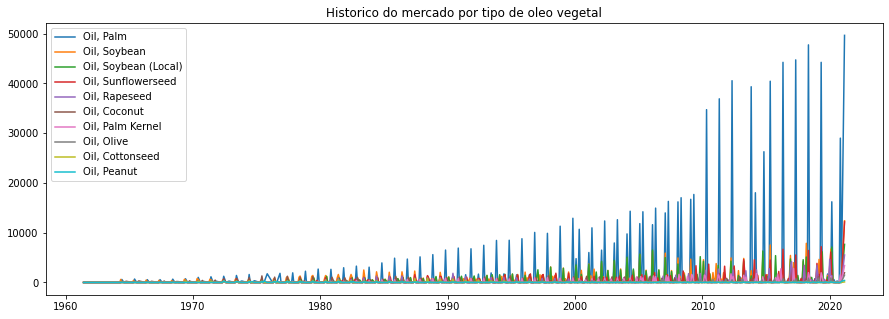

In [74]:
plt.figure(figsize=(15,5))

for col in df.columns:
    plt.plot(df.index, df[col], label=col);

plt.title("Historico do mercado por tipo de oleo vegetal")
plt.legend(loc='best');

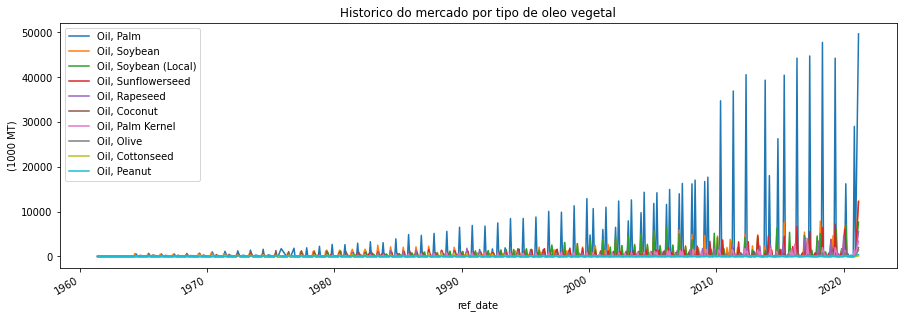

In [75]:
fig, axs = plt.subplots(figsize=(15,5))
df.plot(ax = axs, kind='line');
plt.title("Historico do mercado por tipo de oleo vegetal")
axs.set_ylabel('(1000 MT)');

### TODOS tipos de oleo por país

In [76]:
df_oil = df_usda[(df_usda.Commodity_Code.between(4232000, 4244000)) & (df_usda.Attribute_ID.isin([88]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])
# mkt_oil.nlargest(10, ['mkt_share'] )
# mkt_oil.tail(20)

In [77]:
#Top 10 exportadores mundiais 2020
mkt_oil[mkt_oil.index.get_level_values(1) == 2020].head(10)

,,Value,mkt_share
Country_Name,Market_Year,,
Indonesia,2020,28981.0,0.314089
Malaysia,2020,17324.0,0.187753
Argentina,2020,12339.0,0.133727
Ukraine,2020,5610.0,0.060800
Russia,2020,4560.0,0.049420
Canada,2020,3568.0,0.038669
European Union,2020,3565.0,0.038637
Brazil,2020,3170.0,0.034356
Turkey,2020,1192.0,0.012919


In [78]:
#Top 10 exportadores mundiais 2021
mkt_oil[mkt_oil.index.get_level_values(1) == 2021].head(10)

,,Value,mkt_share
Country_Name,Market_Year,,
Indonesia,2021,30515.0,0.322405
Malaysia,2021,17672.0,0.186713
Argentina,2021,12648.0,0.133632
Ukraine,2021,6186.0,0.065358
Russia,2021,5092.0,0.053799
Brazil,2021,3462.0,0.036578
European Union,2021,3449.0,0.036440
Canada,2021,2901.0,0.030650
Turkey,2021,1155.0,0.012203


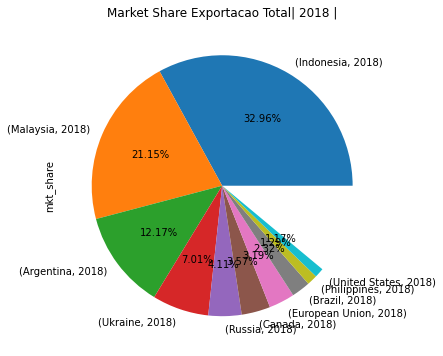

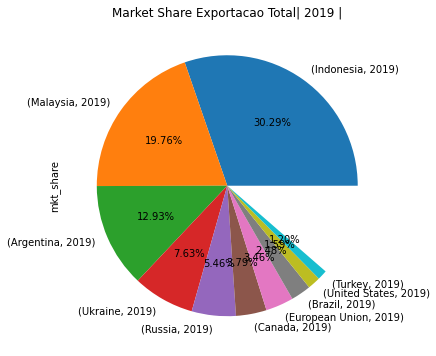

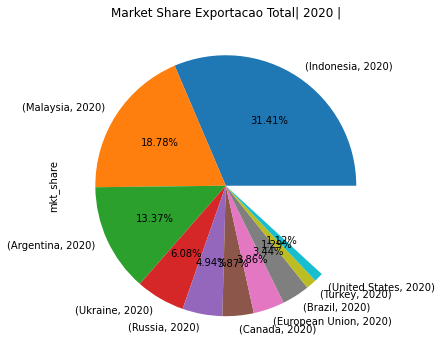

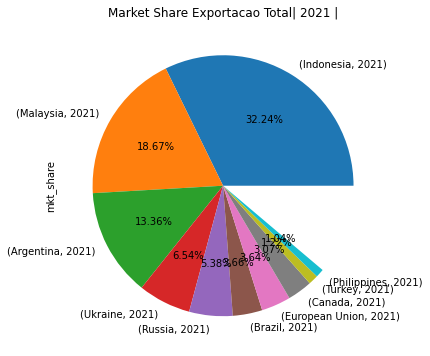

In [79]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share Exportacao Total| {year} |');

### OLEO SOJA por país 

In [80]:
df_oil = df_usda[(df_usda.Commodity_Code== 4232000) & (df_usda.Attribute_ID.isin([88]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])


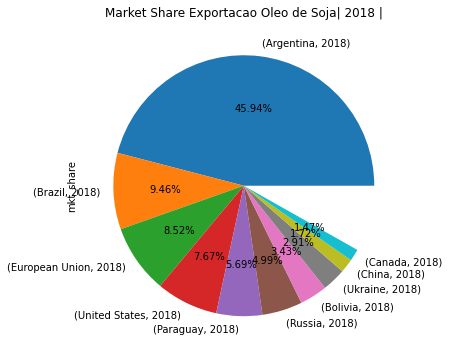

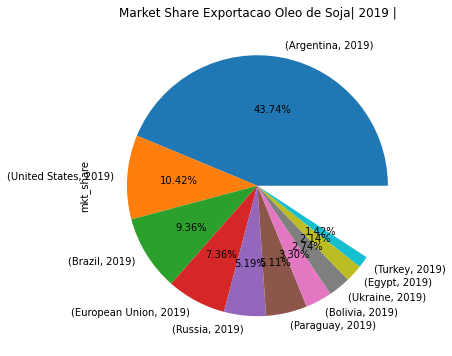

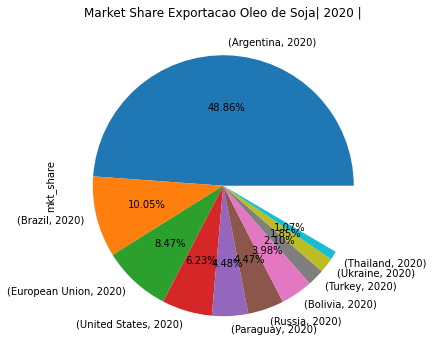

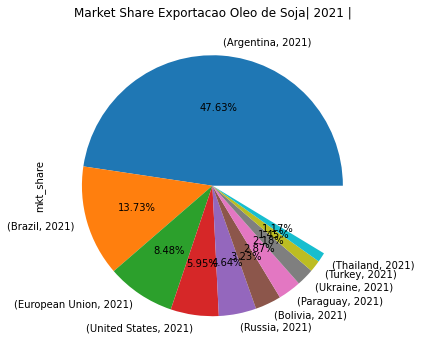

In [81]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share Exportacao Oleo de Soja| {year} |');

### OLEO GIRASSOL por país 

In [82]:
df_oil = df_usda[(df_usda.Commodity_Code== 4236000) & (df_usda.Attribute_ID.isin([88]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])


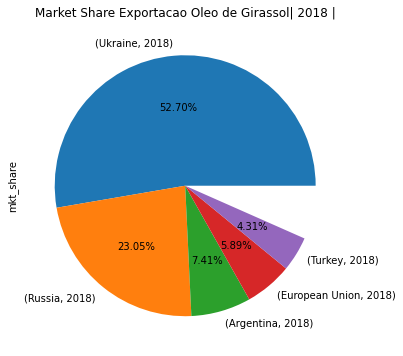

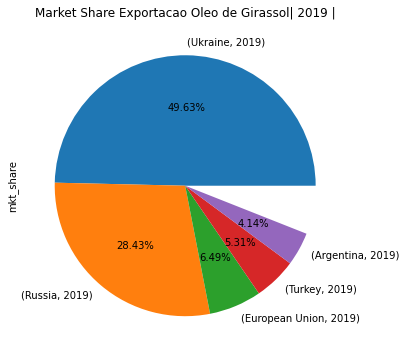

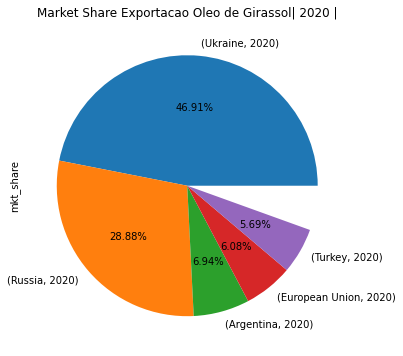

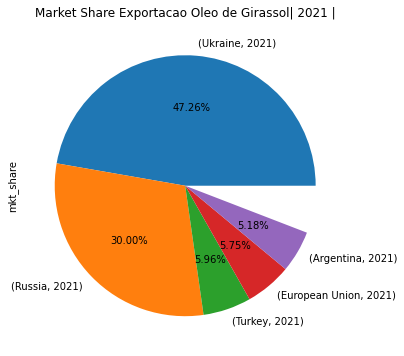

In [83]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(5)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share Exportacao Oleo de Girassol| {year} |');


## Mercado IMPORTACAO - USDA

### TODOS os tipos de Oleo Vegetal

In [84]:
WHAT = 'importacao'
FILTER = 57

In [85]:
df_oil = df_usda[(df_usda.Commodity_Code.between(4232000, 4244000)) & (df_usda.Attribute_ID.isin([FILTER]) )]
df_oil.shape


(22551, 13)

In [86]:
mkt_oil = df_oil.groupby(by=['Market_Year', 'Commodity_Code', 'Commodity_Description', 'Unit_Description' ])['Value'].sum().to_frame()

mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Commodity_Description', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])
mkt_oil

Commodity_Code Unit_Description   Value  \
Commodity_Description Market_Year                                            
Oil, Palm Kernel      1961                4244000        (1000 MT)     0.0   
                      1962                4244000        (1000 MT)     0.0   
                      1963                4244000        (1000 MT)     0.0   
Oil, Soybean          1964                4232000        (1000 MT)   701.0   
Oil, Palm             1964                4243000        (1000 MT)   551.0   
...                                           ...              ...     ...   
Oil, Coconut          2021                4242000        (1000 MT)  1905.0   
Oil, Olive            2021                4235000        (1000 MT)  1347.0   
Oil, Peanut           2021                4234000        (1000 MT)   416.0   
Oil, Soybean (Local)  2021                4232001        (1000 MT)   125.0   
Oil, Cottonseed       2021                4233000        (1000 MT)    80.0   

                                   mkt_share  
Commodity_Description Market_Year             
Oil, Palm Kernel      1961               NaN  
                      1962               NaN  
                      1963               NaN  
Oil, Soybean          1964         34.295499  
Oil, Palm             1964         26.956947  
...                                      ...  
Oil, Coconut          2021          2.293247  
Oil, Olive            2021          1.621524  
Oil, Peanut           2021          0.500782  
Oil, Soybean (Local)  2021          0.150476  
Oil, Cottonseed       2021          0.096304  

[573 rows x 4 columns]

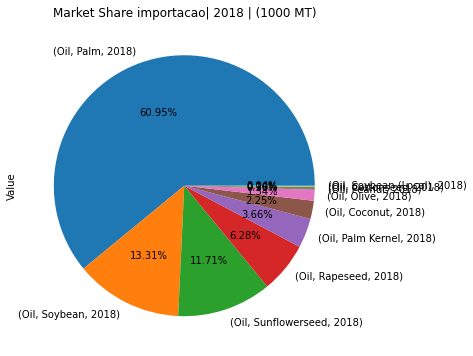

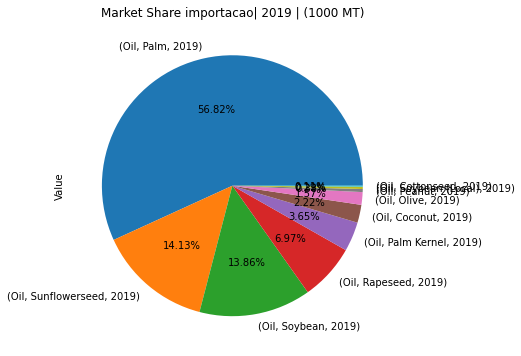

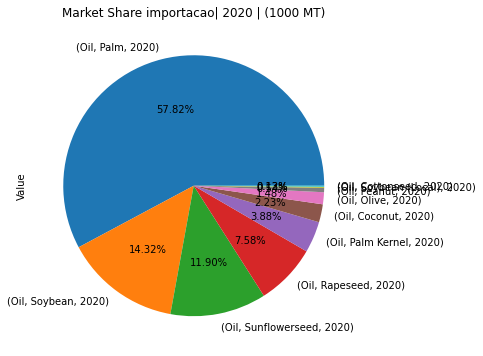

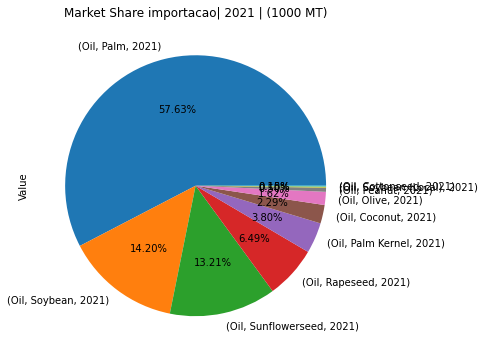

In [87]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year]
    
    df_temp.plot.pie(y='Value', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', 
              title=f'Market Share {WHAT}| {year} | {mkt_oil["Unit_Description"].unique()[0]}');


### TODOS tipos de oleo por país

In [88]:
df_oil = df_usda[(df_usda.Commodity_Code.between(4232000, 4244000)) & (df_usda.Attribute_ID.isin([57]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])
# mkt_oil.nlargest(10, ['mkt_share'] )
# mkt_oil.tail(20)

In [89]:
#Top 10 2020
mkt_oil[mkt_oil.index.get_level_values(1) == 2020].head(10)

,,Value,mkt_share
Country_Name,Market_Year,,
India,2020,13805.0,0.168145
China,2020,13262.0,0.161531
European Union,2020,9938.0,0.121045
United States,2020,4949.0,0.060279
Pakistan,2020,3507.0,0.042715
Malaysia,2020,2203.0,0.026832
Bangladesh,2020,1946.0,0.023702
Iran,2020,1901.0,0.023154
Egypt,2020,1766.0,0.021510


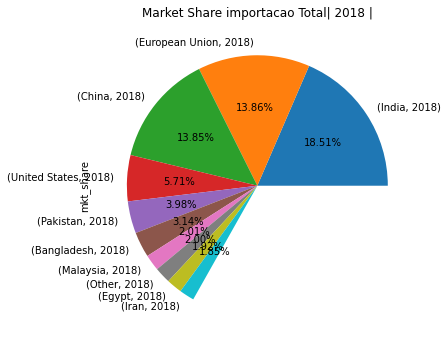

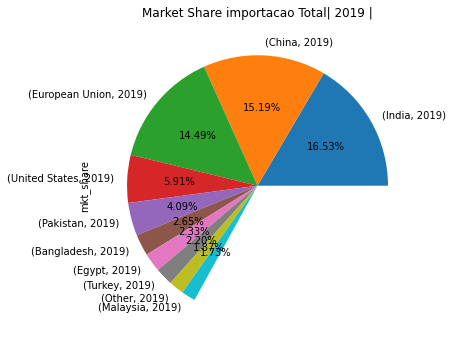

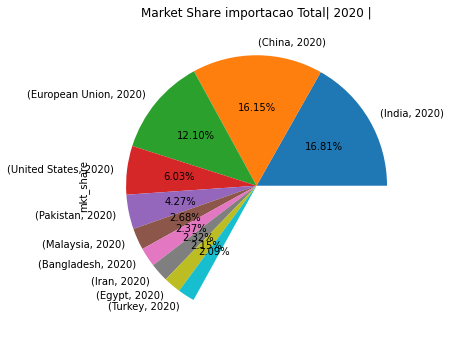

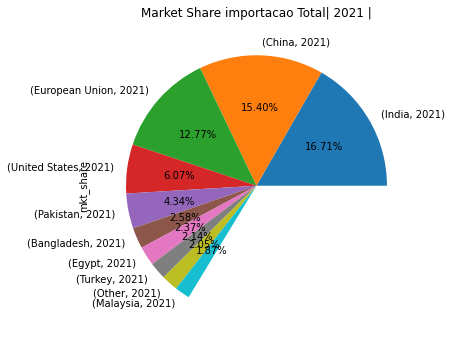

In [90]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share {WHAT} Total| {year} |');

### OLEO SOJA por país 

In [91]:
df_oil = df_usda[(df_usda.Commodity_Code== 4232000) & (df_usda.Attribute_ID.isin([FILTER]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])


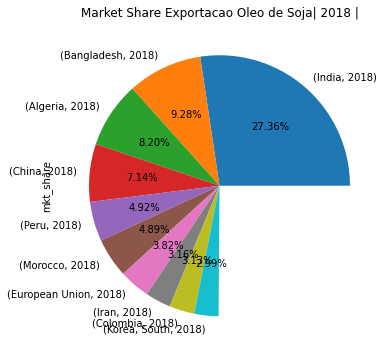

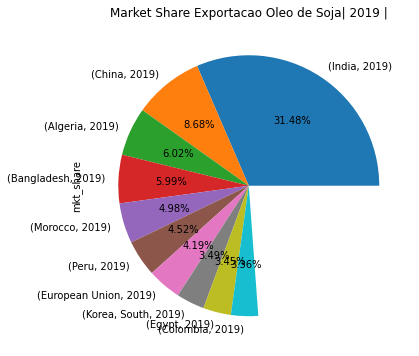

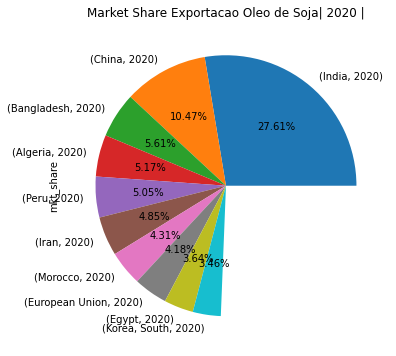

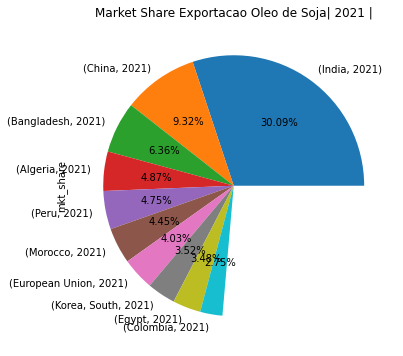

In [92]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share Exportacao Oleo de Soja| {year} |');

### OLEO GIRASSOL por país 

In [93]:
df_oil = df_usda[(df_usda.Commodity_Code== 4236000) & (df_usda.Attribute_ID.isin([FILTER]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])


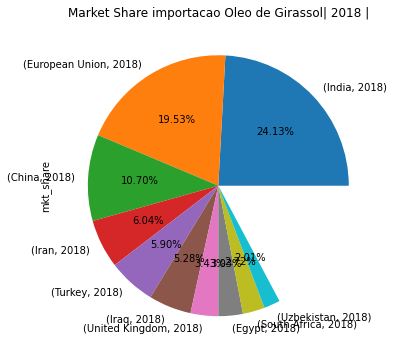

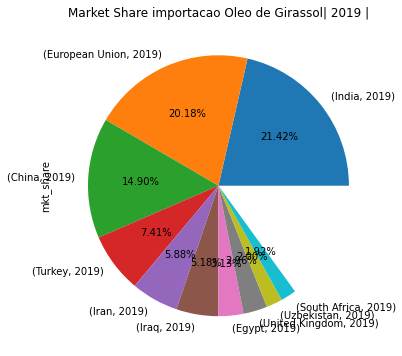

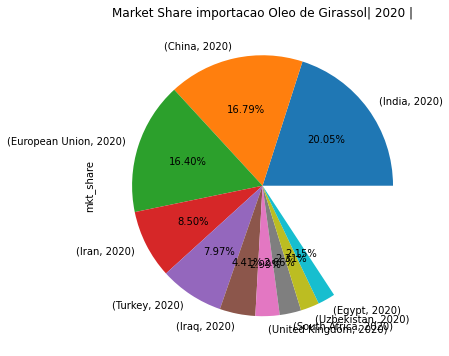

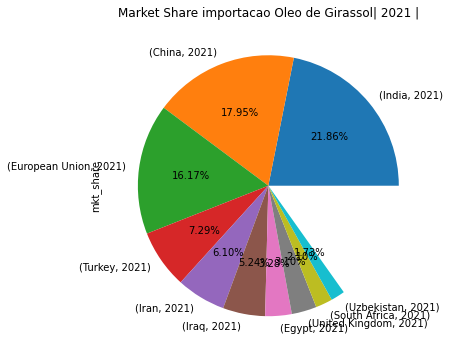

In [94]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share {WHAT} Oleo de Girassol| {year} |');


## Mercado PRODUCAO - USDA

### TODOS os tipos de Oleo Vegetal

In [95]:
WHAT = 'producao'
FILTER = 28

In [96]:
df_oil = df_usda[(df_usda.Commodity_Code.between(4232000, 4244000)) & (df_usda.Attribute_ID.isin([FILTER]) )]
df_oil.shape


(22551, 13)

In [97]:
mkt_oil = df_oil.groupby(by=['Market_Year', 'Commodity_Code', 'Commodity_Description', 'Unit_Description' ])['Value'].sum().to_frame()

mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Commodity_Description', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])
mkt_oil

Commodity_Code Unit_Description   Value  \
Commodity_Description Market_Year                                            
Oil, Palm Kernel      1961                4244000        (1000 MT)    17.0   
                      1962                4244000        (1000 MT)    17.0   
                      1963                4244000        (1000 MT)    18.0   
Oil, Soybean          1964                4232000        (1000 MT)  3648.0   
Oil, Coconut          1964                4242000        (1000 MT)  1971.0   
...                                           ...              ...     ...   
Oil, Palm Kernel      2021                4244000        (1000 MT)  8700.0   
Oil, Peanut           2021                4234000        (1000 MT)  6498.0   
Oil, Cottonseed       2021                4233000        (1000 MT)  5090.0   
Oil, Coconut          2021                4242000        (1000 MT)  3510.0   
Oil, Olive            2021                4235000        (1000 MT)  3283.0   

                                    mkt_share  
Commodity_Description Market_Year              
Oil, Palm Kernel      1961         100.000000  
                      1962         100.000000  
                      1963         100.000000  
Oil, Soybean          1964          37.689844  
Oil, Coconut          1964          20.363674  
...                                       ...  
Oil, Palm Kernel      2021           3.813281  
Oil, Peanut           2021           2.848126  
Oil, Cottonseed       2021           2.230988  
Oil, Coconut          2021           1.538462  
Oil, Olive            2021           1.438966  

[573 rows x 4 columns]

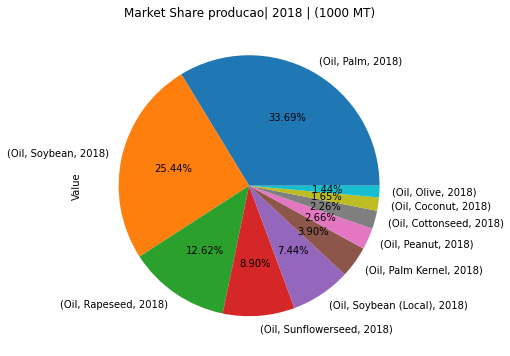

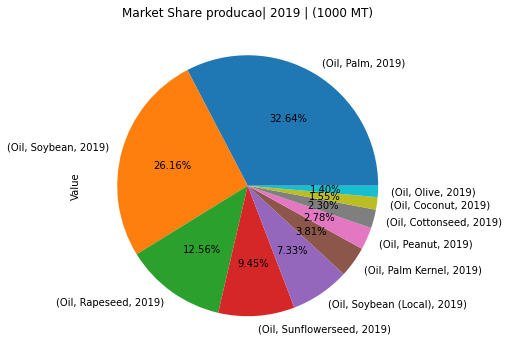

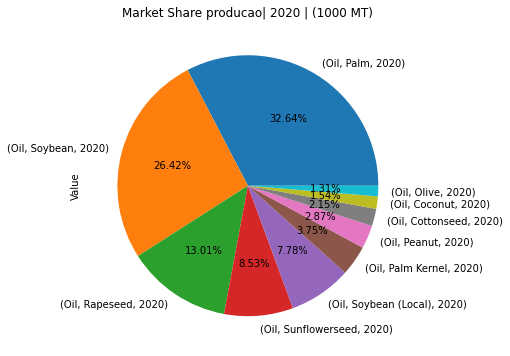

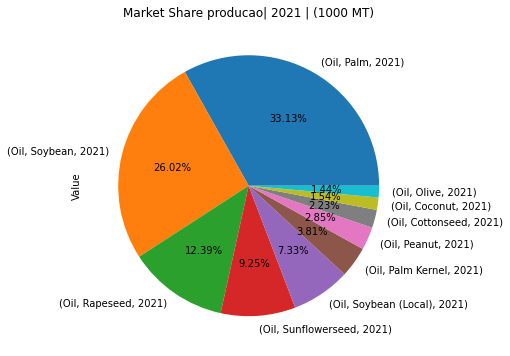

In [98]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year]
    
    df_temp.plot.pie(y='Value', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', 
              title=f'Market Share {WHAT}| {year} | {mkt_oil["Unit_Description"].unique()[0]}');


### TODOS tipos de oleo por país

In [99]:
df_oil = df_usda[(df_usda.Commodity_Code.between(4232000, 4244000)) & (df_usda.Attribute_ID.isin([57]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])
# mkt_oil.nlargest(10, ['mkt_share'] )
# mkt_oil.tail(20)

In [100]:
#Top 10 2020
mkt_oil[mkt_oil.index.get_level_values(1) == 2020].head(10)

,,Value,mkt_share
Country_Name,Market_Year,,
India,2020,13805.0,0.168145
China,2020,13262.0,0.161531
European Union,2020,9938.0,0.121045
United States,2020,4949.0,0.060279
Pakistan,2020,3507.0,0.042715
Malaysia,2020,2203.0,0.026832
Bangladesh,2020,1946.0,0.023702
Iran,2020,1901.0,0.023154
Egypt,2020,1766.0,0.021510


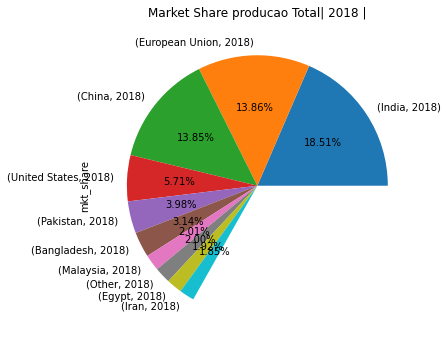

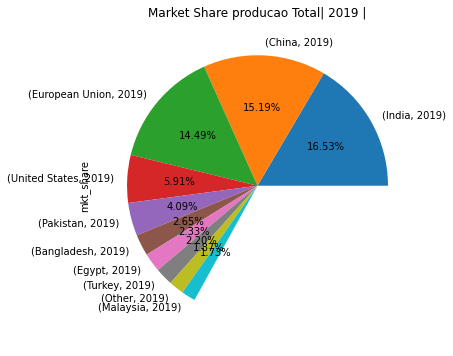

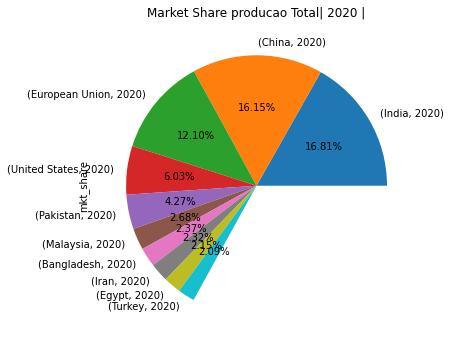

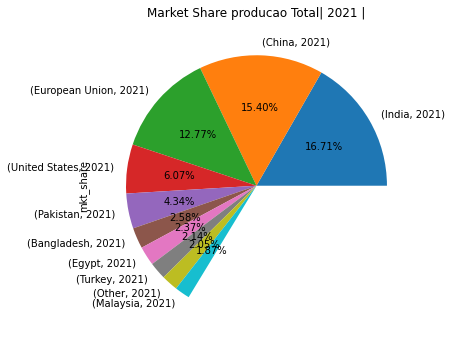

In [101]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share {WHAT} Total| {year} |');

### OLEO SOJA por país 

In [102]:
df_oil = df_usda[(df_usda.Commodity_Code== 4232000) & (df_usda.Attribute_ID.isin([FILTER]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])


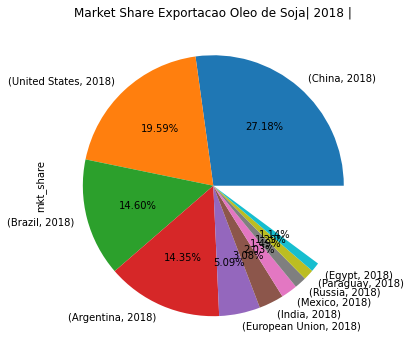

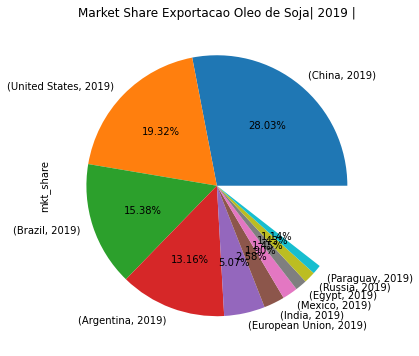

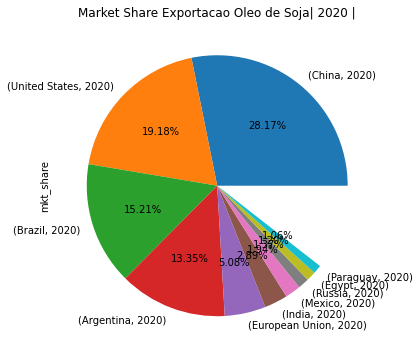

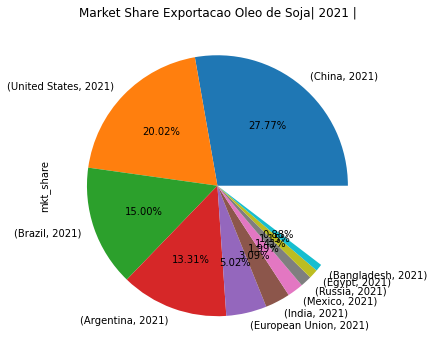

In [103]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share Exportacao Oleo de Soja| {year} |');

### OLEO GIRASSOL por país 

In [104]:
df_oil = df_usda[(df_usda.Commodity_Code== 4236000) & (df_usda.Attribute_ID.isin([FILTER]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])


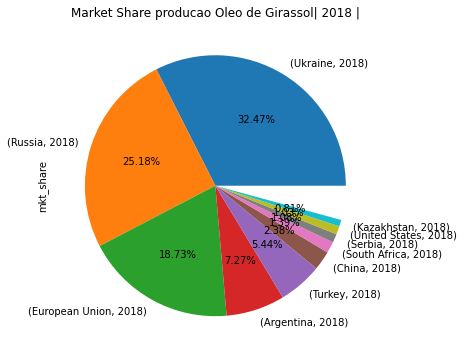

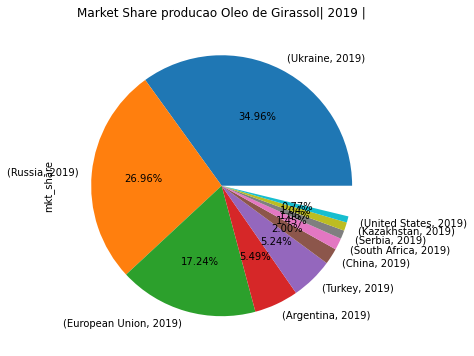

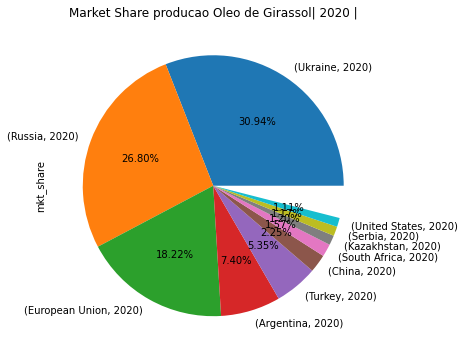

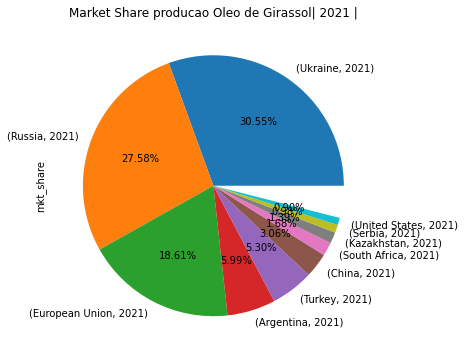

In [105]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share {WHAT} Oleo de Girassol| {year} |');


## Mercado Ending Stocks - USDA

### TODOS os tipos de Oleo Vegetal

In [106]:
WHAT = 'Ending Stocks'
FILTER = 176

In [107]:
df_oil = df_usda[(df_usda.Commodity_Code.between(4232000, 4244000)) & (df_usda.Attribute_ID.isin([FILTER]) )]
df_oil.shape


(22551, 13)

In [108]:
mkt_oil = df_oil.groupby(by=['Market_Year', 'Commodity_Code', 'Commodity_Description', 'Unit_Description' ])['Value'].sum().to_frame()

mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x:100 * x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Commodity_Description', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])
mkt_oil

Commodity_Code Unit_Description  Value  \
Commodity_Description Market_Year                                           
Oil, Palm Kernel      1961                4244000        (1000 MT)    0.0   
                      1962                4244000        (1000 MT)    0.0   
                      1963                4244000        (1000 MT)    0.0   
Oil, Olive            1964                4235000        (1000 MT)  278.0   
Oil, Coconut          1964                4242000        (1000 MT)  196.0   
...                                           ...              ...    ...   
Oil, Palm Kernel      2021                4244000        (1000 MT)  825.0   
Oil, Olive            2021                4235000        (1000 MT)  491.0   
Oil, Coconut          2021                4242000        (1000 MT)  485.0   
Oil, Peanut           2021                4234000        (1000 MT)  322.0   
Oil, Cottonseed       2021                4233000        (1000 MT)  113.0   

                                   mkt_share  
Commodity_Description Market_Year             
Oil, Palm Kernel      1961               NaN  
                      1962               NaN  
                      1963               NaN  
Oil, Olive            1964         39.657632  
Oil, Coconut          1964         27.960057  
...                                      ...  
Oil, Palm Kernel      2021          3.265775  
Oil, Olive            2021          1.943631  
Oil, Coconut          2021          1.919880  
Oil, Peanut           2021          1.274642  
Oil, Cottonseed       2021          0.447312  

[573 rows x 4 columns]

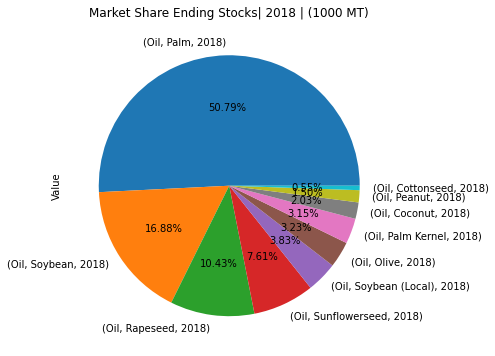

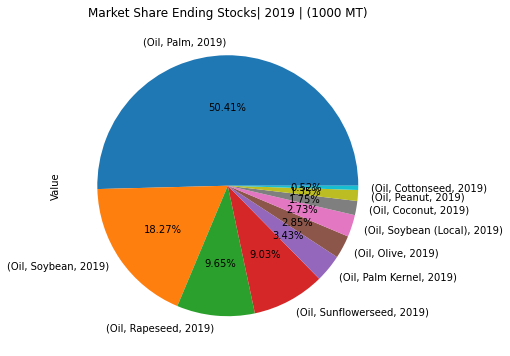

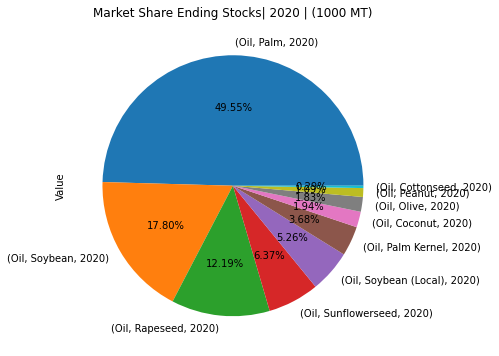

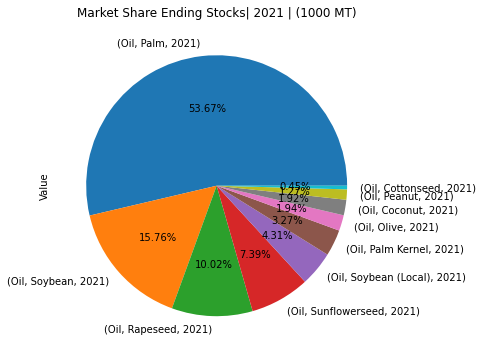

In [109]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year]
    
    df_temp.plot.pie(y='Value', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', 
              title=f'Market Share {WHAT}| {year} | {mkt_oil["Unit_Description"].unique()[0]}');


### TODOS tipos de oleo por país

In [110]:
df_oil = df_usda[(df_usda.Commodity_Code.between(4232000, 4244000)) & (df_usda.Attribute_ID.isin([57]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])
# mkt_oil.nlargest(10, ['mkt_share'] )
# mkt_oil.tail(20)

In [111]:
#Top 10 2020
mkt_oil[mkt_oil.index.get_level_values(1) == 2020].head(10)

,,Value,mkt_share
Country_Name,Market_Year,,
India,2020,13805.0,0.168145
China,2020,13262.0,0.161531
European Union,2020,9938.0,0.121045
United States,2020,4949.0,0.060279
Pakistan,2020,3507.0,0.042715
Malaysia,2020,2203.0,0.026832
Bangladesh,2020,1946.0,0.023702
Iran,2020,1901.0,0.023154
Egypt,2020,1766.0,0.021510


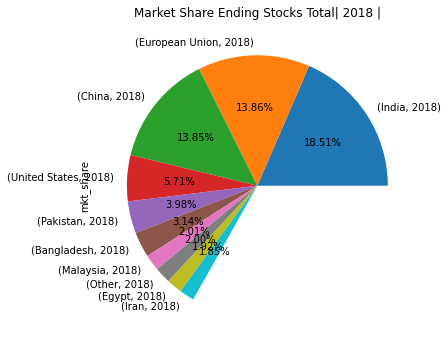

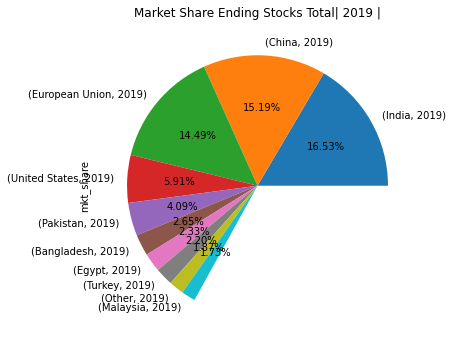

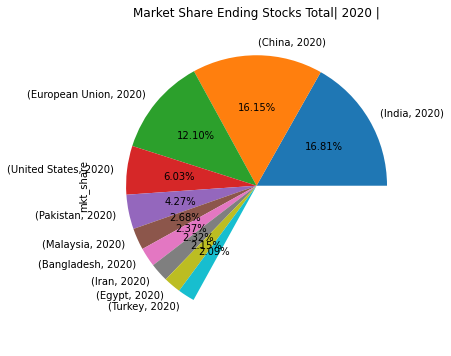

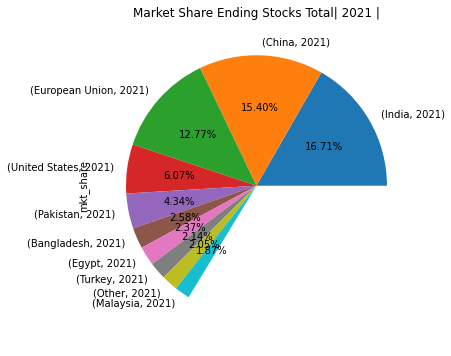

In [112]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share {WHAT} Total| {year} |');

### OLEO SOJA por país 

In [113]:
df_oil = df_usda[(df_usda.Commodity_Code== 4232000) & (df_usda.Attribute_ID.isin([FILTER]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])


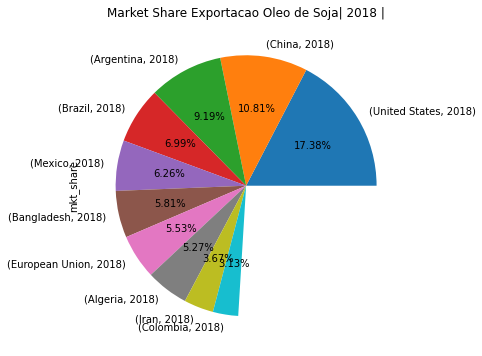

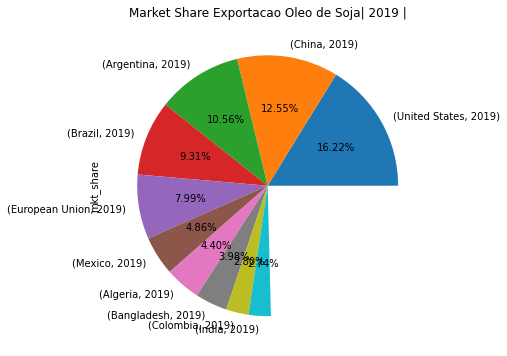

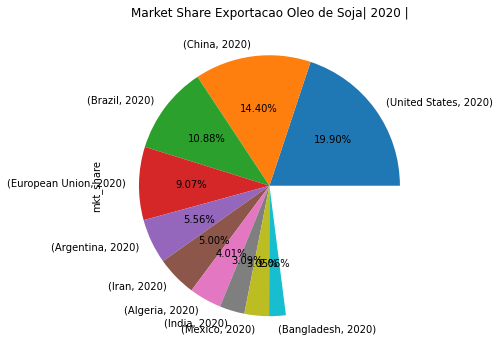

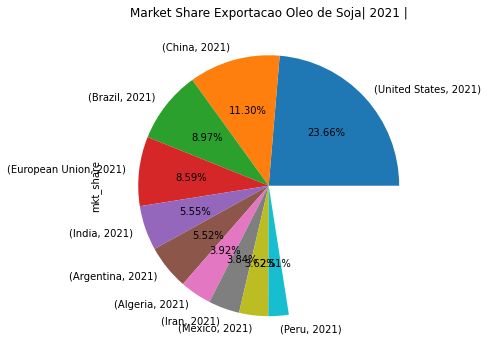

In [114]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share Exportacao Oleo de Soja| {year} |');

### OLEO GIRASSOL por país 

In [115]:
df_oil = df_usda[(df_usda.Commodity_Code== 4236000) & (df_usda.Attribute_ID.isin([FILTER]) )]

mkt_oil = df_oil.query('Value >0').groupby(by=['Market_Year', 'Country_Name' ])['Value'].sum().to_frame()


mkt_oil['mkt_share'] = list(mkt_oil.groupby(level=0).apply(lambda x: x / float(x.sum()))['Value'])
mkt_oil = mkt_oil.reset_index().set_index(['Country_Name', 'Market_Year'], append=False)
mkt_oil = mkt_oil.sort_values(['Market_Year','mkt_share'], ascending=[True, False])


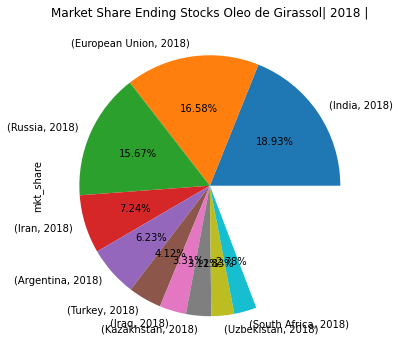

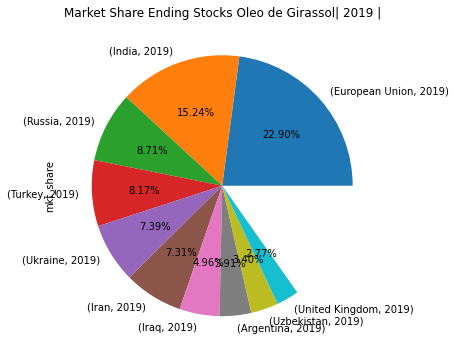

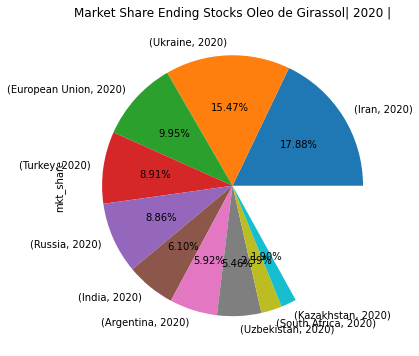

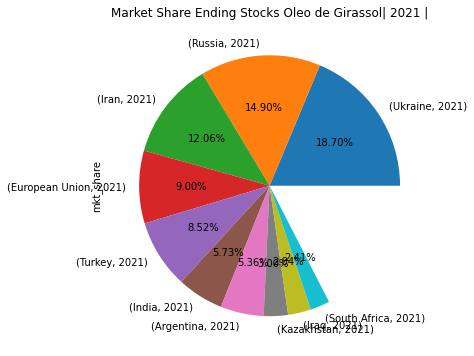

In [116]:
years = [2018, 2019, 2020, 2021]

for year in years:
    df_temp = mkt_oil[mkt_oil.index.get_level_values(1) == year].head(10)
    
    df_temp.plot.pie(y='mkt_share', figsize=(6,6), legend=None, 
              autopct='%1.2f%%', normalize=False, 
              title=f'Market Share {WHAT} Oleo de Girassol| {year} |');


# Mercado Global - IMF

**INTERNATIONAL MONETARY FUND**

Referencia usada pelo YChart (preços de Girassol)
- https://www.imf.org/en/Home

- [filtro](https://www.imf.org/en/Publications/WEO/weo-database/2021/October/weo-report?a=1&c=001,110,163,119,123,998,200,505,511,903,205,400,603,&s=PFOODW,PSOYB,PSMEA,PSOIL,PROIL,PPOIL,PSUNO,POLVOIL,PRAWMW,PTIMBW,PHARDW,&sy=1980&ey=2026&ssm=0&scsm=1&scc=0&ssd=1&ssc=0&sic=0&sort=country&ds=.&br=1)

# Mercado Global - Sunflower Association

Report de 2021 [ref](https://www.sunflowernsa.com/stats/us-crop-quality/)

[ref](https://www.sunflowernsa.com/uploads/38/2021SunflowerCropQualityReport.pdf)

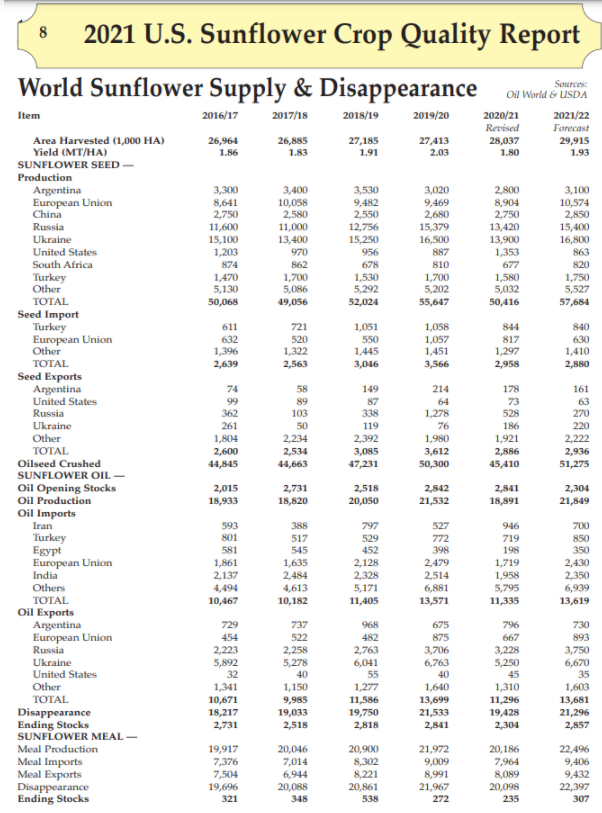

# Mercado Global - CME GROUP

- https://www.cmegroup.com/trading/agricultural/soybean-reports.html

## Supply Charts
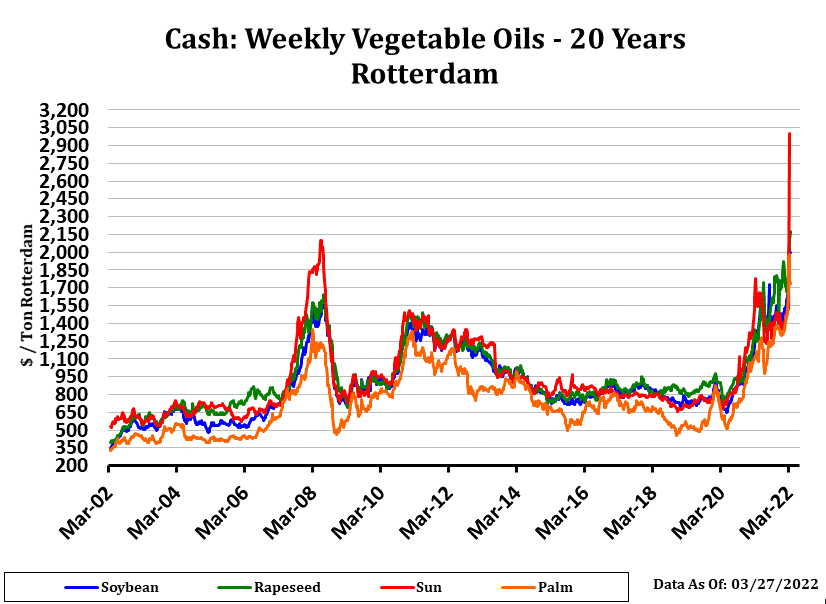
[ref](https://www.cmegroup.com/trading/agricultural/files/ht_charts/bo_rapsunpalm88.gif)

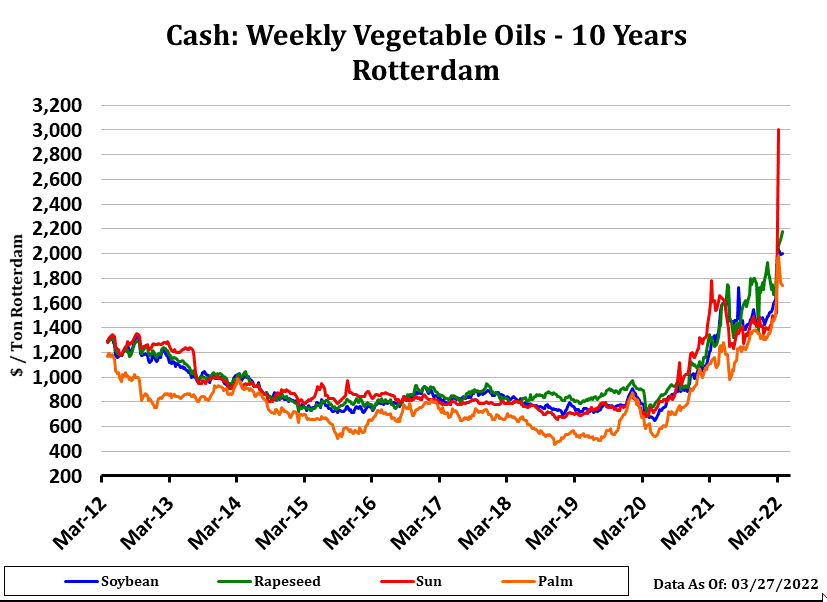

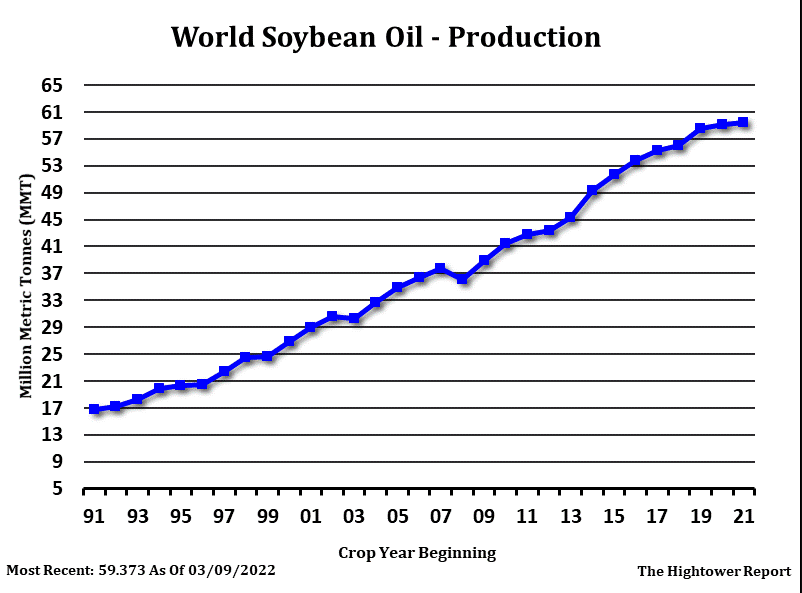

## Demanda Charts

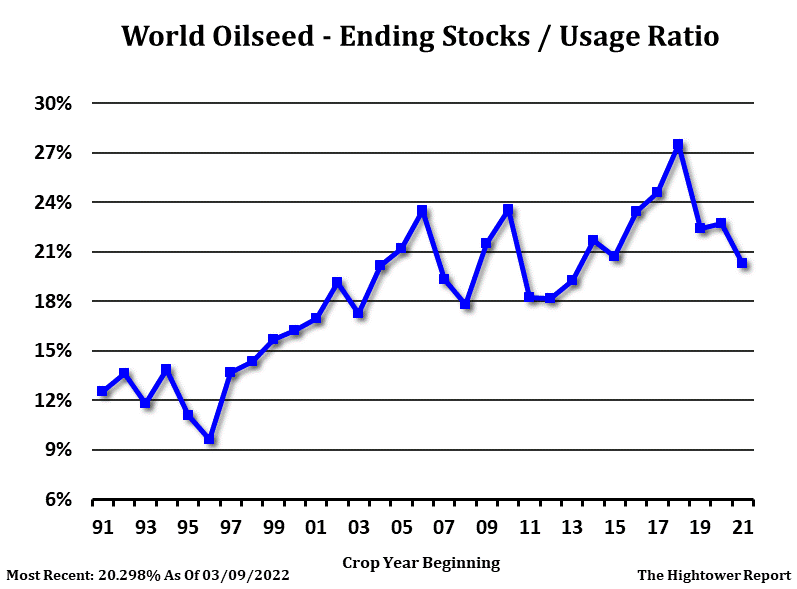

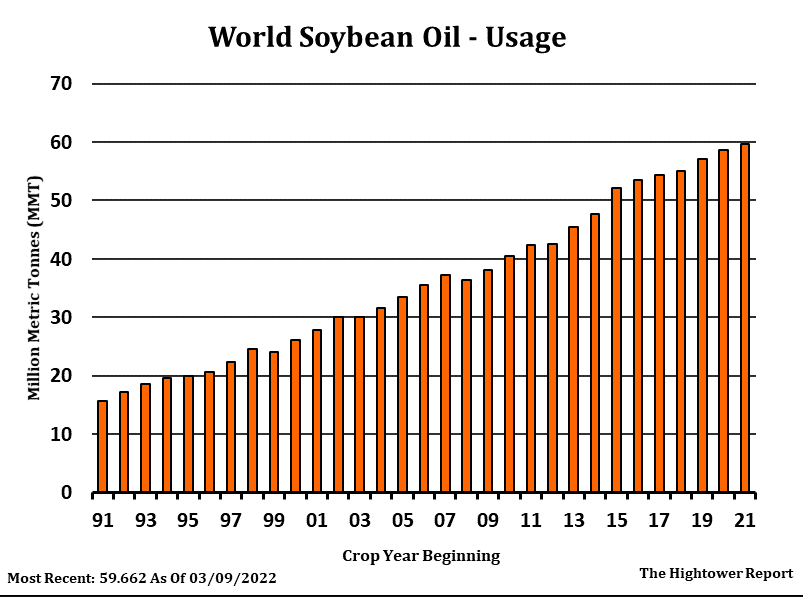

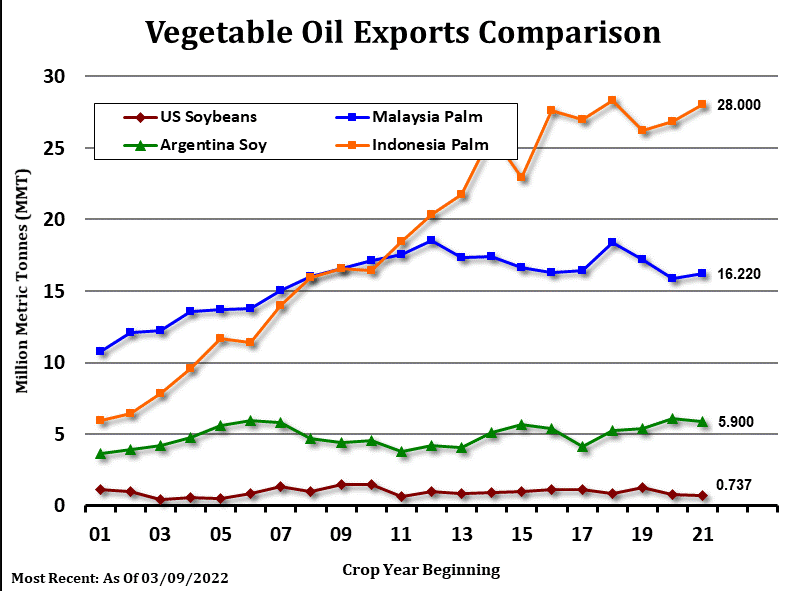

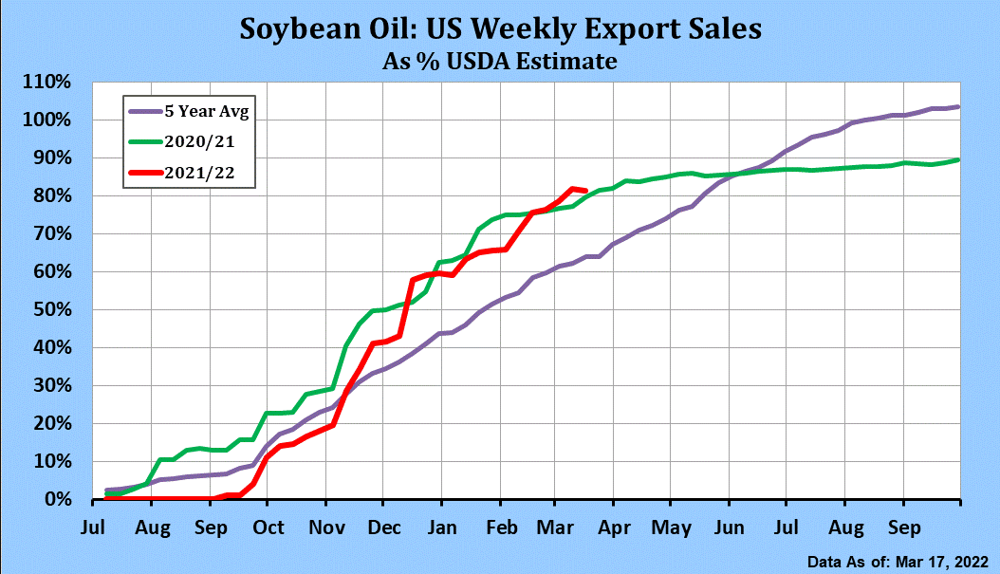

# Google Trends
- https://trends.google.com.br/trends/explore?q=sunflower%20oil,vegetable%20oil,soybean%20oil,rapeseed
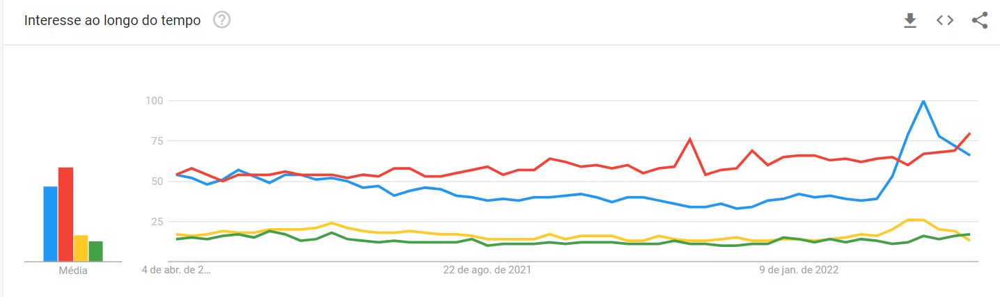

- https://trends.google.com.br/trends/explore?date=today%205-y&q=sunflower%20oil,vegetable%20oil,soybean%20oil,rapeseed

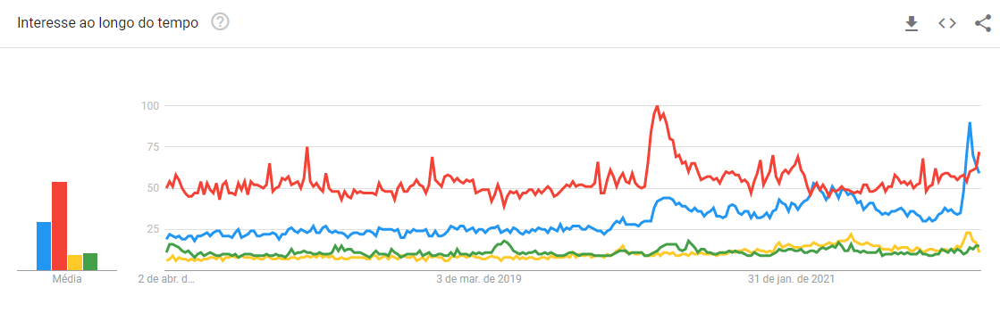